# Search engine for Medical Information Retrieval

Team Members:
- Armani Filippo [Communication Leader] - 865939
- Moleri Andrea - 902011

## Importing the data

The code begins by installing and importing all the dependencies needed to run the code. We also make sure that PyTerrier is started and that all essential components for NLKT are downloaded.

In [ ]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import subprocess

for package in ["beir", "git+https://github.com/terrier-org/pyterrier.git#egg=python-terrier", "git+https://github.com/Georgetown-IR-Lab/OpenNIR", "emoji"]:
  print("Installing", package ,"...", end=" ")

  subprocess.Popen(
      ["pip", "install", "--upgrade", str(package)],
      stdin=subprocess.PIPE,
      stdout=subprocess.DEVNULL,
      stderr=subprocess.DEVNULL,
  ).communicate()

  print("Done!")

import pyterrier as pt
from tqdm import tqdm

# Check if PyTerrier Java is already started
if not pt.java.started():
    print("\nStarting PyTerrier... \n")
    pt.utils.set_tqdm('notebook')
    pt.java.init()  # Initialize Java for PyTerrier
else:
    print("PyTerrier is already initialized.")

from beir import util, LoggingHandler
from beir.retrieval import models
from beir.datasets.data_loader import GenericDataLoader
from beir.retrieval.evaluation import EvaluateRetrieval
from beir.retrieval.search.dense import DenseRetrievalExactSearch as DRES

import logging
import pathlib, os

import pandas as pd

import re
from textblob import TextBlob
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import numpy as np

import matplotlib.pyplot as plt

Installing beir ... Done!
Installing git+https://github.com/terrier-org/pyterrier.git#egg=python-terrier ... Done!
Installing git+https://github.com/Georgetown-IR-Lab/OpenNIR ... Done!
Installing emoji ... Done!

Starting PyTerrier... 

terrier-assemblies 5.11 jar-with-dependencies not found, downloading to /root/.pyterrier...
Done
terrier-python-helper 0.0.8 jar not found, downloading to /root/.pyterrier...
Done


Java started and loaded: pyterrier.java, pyterrier.terrier.java [version=5.11 (build: craig.macdonald 2025-01-13 21:29), helper_version=0.0.8]
/usr/local/lib/python3.11/dist-packages/beir/util.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


After completing the installation and import of the libraries, the first fundamental step in this project is data importation. The following code, already provided in the supplied outline, is divided into three parts.

The first part focuses on configuring a logging system. Logging is essential for monitoring the execution of a script, especially in applications involving multiple processing stages. In this case, the logging system is set up to print detailed messages to the console, each of which includes a timestamp in a readable format. This approach helps diagnose potential issues, track the script's progress, and maintain a record of the operations performed.

The second part of the code is dedicated to downloading the NFCorpus dataset. This dataset is hosted on a remote server, and the code constructs the URL required to access it. Once the path is defined, the dataset is downloaded as a ZIP file and subsequently extracted into a specific directory in the filesystem. The destination directory is organized so that the extracted files are easily accessible and structured for use in subsequent stages.

In the third and final part, the extracted data is loaded into memory using a dedicated class. This class is designed to read the dataset's content, interpret it, and divide it into three main components: a corpus of documents, a set of queries, and a set of relationships (qrels) that map the queries to relevant documents. This type of division is typical in the context of search and information retrieval, where the corpus represents the database of documents, the queries are search requests, and the qrels provide a reference evaluation to measure the effectiveness of a retrieval system.

In [ ]:
#### Just some code to print debug information to stdout
logging.basicConfig(format='%(asctime)s - %(message)s',
                    datefmt='%Y-%m-%d %H:%M:%S',
                    level=logging.INFO,
                    handlers=[LoggingHandler()])
#### /print debug information to stdout

#### Download NFCorpus.zip dataset and unzip the dataset
dataset = "nfcorpus"
url = "https://public.ukp.informatik.tu-darmstadt.de/thakur/BEIR/datasets/{}.zip".format(dataset)
out_dir = os.path.join(pathlib.Path('./').parent.absolute(), "datasets")
data_path = util.download_and_unzip(url, out_dir)

#### Provide the data_path where NFCorpus has been downloaded and unzipped
corpus, queries, qrels = GenericDataLoader(data_folder=data_path).load(split="test")

/content/datasets/nfcorpus.zip:   0%|          | 0.00/2.34M [00:00<?, ?iB/s]

  0%|          | 0/3633 [00:00<?, ?it/s]

After downloading and loading the data, the main components are transformed into dataframes to simplify management and analysis. Both the corpus and queries undergo a direct conversion into tabular structures, preserving their basic data structure without significant modifications.

The relevance relationships (qrels), on the other hand, require more extensive processing. Initially represented as a nested dictionary, where each query ID is associated with a dictionary of documents and their corresponding relevance scores, these relationships are restructured. This format is flattened into a list of dictionaries, where each element contains three fields: `query_id`, `doc_id`, and `relevance`. The list is then converted into a dataframe.

In [ ]:
data = pd.DataFrame.from_dict(corpus, orient='index')
data['doc_id'] = data.index
data.reset_index(drop=True, inplace=True)

queries = pd.DataFrame.from_dict(queries, orient='index', columns=['query_text'])
queries['query_id'] = queries.index
queries.reset_index(drop=True, inplace=True)

flat_qrels = [{'query_id': query_id, 'doc_id': doc_id, 'relevance': relevance}
              for query_id, inner_dict in qrels.items()
              for doc_id, relevance in inner_dict.items()]

qrels_df = pd.DataFrame(flat_qrels)

## PART I: Analysis of the dataset

### Introduction

As previously mentioned, the data is structured into three main DataFrames, each serving a specific purpose and with clearly defined dimensions:

1. `data`: a DataFrame with dimensions $3633 \times 3$ that represents the collection of documents used for the search. Each row in the DataFrame corresponds to a document, described by three key attributes:
   - `doc_id`: a unique identifier for each document.
   - `text`: a string containing the main body of the document, i.e., the text on which the search will be performed.
   - `title`: a short string representing the title of the document, useful as a quick reference or summary.

In [ ]:
display(data.sample(20))
print("\n", "Shape of data:", data.shape)

,text,title,doc_id
1911,Smoking is an established risk factor for panc...,Cigarette Smoking and Pancreatic Cancer: A Poo...,MED-3318
2847,"The cytotoxic effects of Triphala (TPL), an In...",Cytotoxic response of breast cancer cell lines...,MED-4532
2142,Using the infrastructure of the National Atmos...,Wet deposition of fission-product isotopes to ...,MED-3635
666,Ciguatera is an important form of human poison...,Ciguatera: recent advances but the risk remains.,MED-1570
1702,"BACKGROUND: Elevated levels of lipids, such as...",Strawberry modulates LDL oxidation and postpra...,MED-2972
2347,"BACKGROUND: Mammalian lignans, enterolactone (...",Effect of mammalian lignans on the growth of p...,MED-3875
488,This paper documents the recent (1976-1995) li...,The acute effects of exercise on mood state.,MED-1358
1461,There are now extensive scientific data sugges...,Prostate cancer and inositol hexaphosphate: ef...,MED-2579
593,PURPOSE: Plant-based nutrition achieved corona...,A way to reverse CAD?,MED-1489
2955,Endemic cretinism includes two syndromes: a mo...,Cretinism revisited.,MED-4668



 Shape of data: (3633, 3)


2. `queries`: a DataFrame with dimensions $323 \times 2$ that represents a set of possible questions or queries that can be submitted to the search engine. This DataFrame serves as input to the system, enabling the comparison between queries and documents. Each row describes a single query through the following fields:
   - `query_id`: a unique identifier associated with the query.
   - `text`: a string containing the query text, which is the content of the question that will be matched against the documents in the `data` DataFrame.

In [ ]:
display(queries.sample(20))
print("\n", "Shape of queries:", queries.shape)

,query_text,query_id
42,accidents,PLAIN-478
74,canker sores,PLAIN-817
156,norovirus,PLAIN-1731
154,neurocysticercosis,PLAIN-1710
151,myelopathy,PLAIN-1679
180,rapamycin,PLAIN-1983
243,Turmeric Curcumin and Osteoarthritis,PLAIN-2650
158,okra,PLAIN-1752
217,whiting,PLAIN-2375
8,Chronic Headaches and Pork Parasites,PLAIN-91



 Shape of queries: (323, 2)


3. `qrels_df` (Query Relevance Judgments DataFrame): a DataFrame with dimensions $12334 \times 3$ that contains relevance judgments, used to evaluate the effectiveness of the information retrieval system. This DataFrame defines the "ground truth," indicating which documents are considered relevant for each query. Specifically, each row consists of:
   - `query_id`: a unique identifier that links the judgment to a specific query.
   - `doc_id`: a unique identifier that links the judgment to a specific document.
   - `relevance`: a value that measures the relevance of the document `doc_id` concerning the query `query_id`. This field is essential for performance evaluation, as it helps determine how accurately the system retrieves the most relevant documents.

In [ ]:
display(qrels_df.sample(20))
print("\n", "Shape of qrels_df:", qrels_df.shape)

,query_id,doc_id,relevance
7051,PLAIN-1805,MED-2166,1
8785,PLAIN-2061,MED-3621,1
3530,PLAIN-966,MED-4853,1
1688,PLAIN-531,MED-4536,1
11728,PLAIN-3251,MED-4095,1
4300,PLAIN-1288,MED-2449,1
9647,PLAIN-2281,MED-2098,1
9390,PLAIN-2102,MED-4466,1
1953,PLAIN-660,MED-2799,1
4689,PLAIN-1409,MED-1765,1



 Shape of qrels_df: (12334, 3)


To conduct a cleaner and more detailed analysis, the `data` DataFrame has been divided into two separate parts:  

- `data_text`: containing only the `text` and `doc_id` columns.  
- `data_title`: containing only the `title` and `doc_id` columns.  

This approach ensures better organization and improves the readability of the data.  

In [ ]:
data_text = data[["text", "doc_id"]].copy()
data_title = data[["title", "doc_id"]].copy()

### Analysis of `qrels_df`

`qrels`, as already mentioned, plays a fundamental role in evaluating the performance of information retrieval systems. The information contained provide a structured assessment of the relevance of specific documents to user queries, serving as a benchmark for measuring retrieval effectiveness. By examining the distribution and characteristics of qrels, we can gain valuable insights into the composition of relevance assessments, their variability, and their alignment with query and document properties.

This analysis aims to explore the statistical and structural patterns within qrels data, focusing on key aspects such as the frequency of relevance labels, distribution of relevant documents per query, and the presence of potential outliers or inconsistencies. Understanding these patterns is essential for ensuring the reliability of qrels as a gold standard in retrieval experiments and for identifying potential biases or irregularities that may affect downstream evaluations.

Through this examination, we aim to provide a comprehensive overview of the qrels dataset, highlighting areas of interest and potential implications for information retrieval system design and evaluation

#### Relevance label

In an initial analysis, it can be observed that the *relevance label* column contains only two distinct values: 1 and 2. Moreover, the frequency of the value 1 is significantly higher than that of the value 2. This imbalance suggests that the value 2 represents more exclusive information or a less frequent condition.  

Another point to consider is the number of explicit relationships present in the dataframe, which amounts to 12,334. This is significantly lower than the total number of possible query-document pairs, calculated to be 1,173,459. This indicates that the majority of query-document pairs are not represented in the dataframe, and for these, a relevance value of 0 can be implicitly assumed.  

Based on these observations, the meaning of the *relevance label* values can be interpreted as follows:  
- 0 (query-document pair not present in the dataframe): not relevant, i.e., lacking any significant relationship.  
- 1: slightly relevant, indicating a modest or marginal level of relevance.  
- 2: highly relevant, representing a strong or significant relationship between the query and the document.  

This classification helps provide a clearer understanding of the data context and the implications related to the distribution of relevance labels.

In [ ]:
ndoc = len(data['doc_id'].unique())
nquery = len(queries['query_id'].unique())

print('Number of judgements (rows of qrels):', qrels_df.shape[0])
print()
print('Number of document:', ndoc)
print('Number of queries:', nquery)
print()
print('Number of unique document-query pairs in qrels_df:', len(qrels_df[['doc_id', 'query_id']].copy().drop_duplicates().values.tolist()))
print('Number of possible document-query pair:', ndoc, "*", nquery, "=", ndoc * nquery)

print("\nFrequency of labels:\n")
qrels_df['relevance'].value_counts()

Number of judgements (rows of qrels): 12334

Number of document: 3633
Number of queries: 323

Number of unique document-query pairs in qrels_df: 12334
Number of possible document-query pair: 3633 * 323 = 1173459

Frequency of labels:



,count
relevance,
1,11758
2,576


#### Distribution of number of relevant documents per query

Before analyzing the graphs relating to the distribution of documents relevant to queries, we want to highlight with the code below, in a more explicit way than later, that not all document ids appear in qrels_df

In [ ]:
print(ndoc == len(qrels_df['doc_id'].unique()))

False


The analysis of the histogram representing the distribution of relevant documents for each query in **qrels** allows for some preliminary observations.  

The histogram distinguishes between the two levels of relevance: 'Relevance = 1' (blue) for moderately relevant documents and 'Relevance = 2' (orange) for highly relevant ones.

We can observe that the dataset is highly uneven: some queries cover many relevant documents, while more specific ones have very few. This makes it harder for retrieval algorithms to balance queries with rich relevance and those with little relevance. Queries with many Relevance = 1 documents might inflate the performance of algorithms better suited for generic queries.  

It is also important to highlights that moderately relevant documents make up most of the results for the queries, even when looking at their distribution rather than just total numbers. In fact, highly relevant documents (Relevance = 2) are less frequent and have a narrower distribution. For most queries, the number of these documents is zero, with only a few queries having high values.  

In general, this imbalance affects evaluation metrics. Metrics like **Precision@K** penalize systems that retrieve many moderately relevant documents, while metrics like **NDCG**, which consider degrees of relevance, handle these differences better.  

Overall, the bias toward Relevance = 1 highlights the need to adjust algorithms to prioritize highly relevant documents (Relevance = 2) and improve the quality of the information retrieval system.

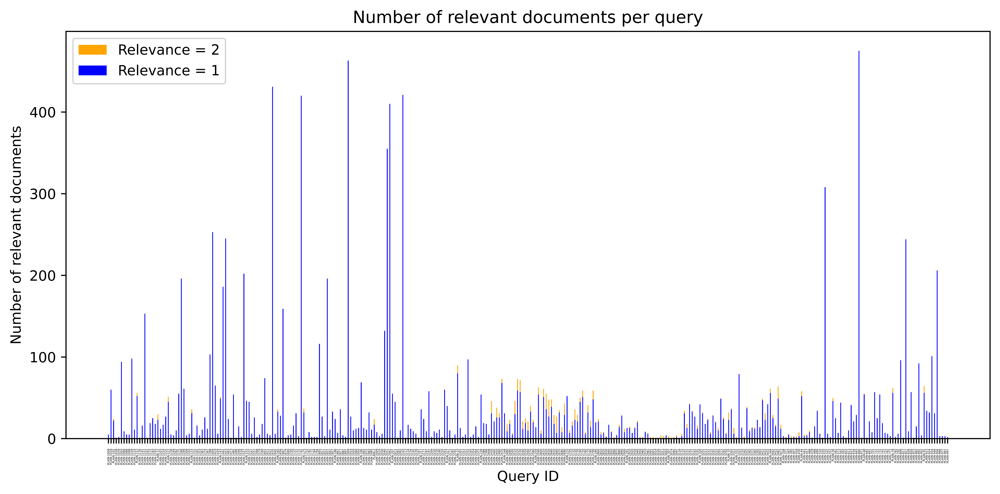

In [ ]:
query_id = sorted(list(set(qrels_df['query_id'])))

doc_id = list(set(qrels_df['doc_id']))

relevance1 = qrels_df[qrels_df['relevance'] == 1]
relevance2 = qrels_df[qrels_df['relevance'] == 2]

rt = []
r1 = []
r2 = []

for id in query_id:
  n1 = len(relevance1[relevance1['query_id'] == id])
  n2 = len(relevance2[relevance2['query_id'] == id])

  rt.append(n1 + n2)
  r1.append(n1)
  r2.append(n2)

bar_width = 0.8
x = np.arange(len(query_id)) * 2.5

plt.figure(figsize=(10, 5), dpi=1000)

plt.bar(x, rt, width=bar_width, label='Relevance = 2', color='orange')
plt.bar(x, r1, width=bar_width, label='Relevance = 1', color='blue')

plt.xlabel('Query ID')
plt.ylabel('Number of relevant documents')
plt.title('Number of relevant documents per query')

plt.xticks(x, query_id, rotation=90, fontsize=2)

plt.legend(loc='best')

plt.tight_layout()

plt.show()

Let’s delve into the analysis using boxplots.

The first boxplot, which represents the total number of relevant documents per query, shows a particularly wide distribution with significant variability. The average number of relevant documents is 38.18, while the median is 16, indicating that the number of relevant documents tends to concentrate around lower values but is influenced by queries with very high numbers of results. The total range spans from a minimum of 1 relevant document to a maximum of 475, highlighting that some queries are associated with an exceptionally high number of relevant documents. The distribution of quartiles is rather unbalanced: the first quartile stops at 5 documents, while the third quartile reaches 39.5 documents. This wide interquartile range of 34.5 documents reflects a strong dispersion in the data distribution.

Outliers play a crucial role in this distribution. It is observed that values above 91.25 relevant documents per query are considered outliers, and 27 queries fall into this category. These queries generate an extremely high number of relevant documents, contributing to the positive skewness of the distribution and pulling the mean upward. This phenomenon suggests a clear right-skewed asymmetry, where most queries have a relatively low number of relevant documents, but a small group generates extremely high values.

This variability in the distribution can certainly be attributed to the nature of the queries, which may vary significantly in specificity and complexity, or to the methods used to annotate relevance in the dataset. Queries with many relevant documents might represent broad or common topics, while those with fewer results might concern more specific themes.

Numerical Values (total)



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,38.185759,475,1,1.0,5.0,16.0,39.5,475.0,34.5,-46.75,91.25,0.0,27.0,27.0
ID,NaN,PLAIN-660,PLAIN-1028,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Boxplot (total)



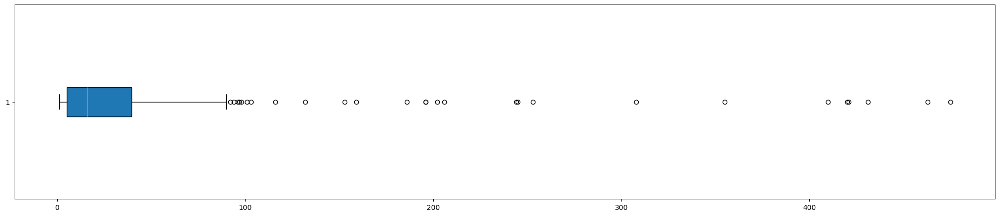

In [ ]:
def show_statistic(df, label=""):
  Q1 = np.percentile(df['len'], 25)
  Q3 = np.percentile(df['len'], 75)
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  lower_outliers = len([x for x in df['len'] if x < lower_bound])
  upper_outliers = len([x for x in df['len'] if x > upper_bound])

  if label != "":
    print("Numerical Values (" + label + ")\n")
  else:
    print("Numerical Values \n")

  statistic_info = {
      "mean": df['len'].mean(),
      "max": df['len'].max(),
      "min": df['len'].min(),
      "Q0": np.percentile(df['len'], 0),
      "Q1": Q1,
      "Q2": np.percentile(df['len'], 50),
      "Q3": Q3,
      "Q4": np.percentile(df['len'], 100),
      "IQR": Q3 - Q1,

      "lower_bound": lower_bound,
      "upper_bound": upper_bound,

      "n lower_outliers": lower_outliers,
      "n upper_outliers": upper_outliers,
      "total_outliers": lower_outliers + upper_outliers
  }

  max = list(df['len'][df['len'] == df['len'].max()].index)[0]
  min = list(df['len'][df['len'] == df['len'].min()].index)[0]

  id_info = {
      "max": df['id'][max],
      "min": df['id'][min]
  }

  display(pd.DataFrame([statistic_info, id_info], index=['Data', 'ID']))


def show_boxplot(df, label=""):

  if label != "":
    print("\nBoxplot (" + label + ")\n")
  else:
    print("\nBoxplot \n")

  plt.figure(figsize=(25, 5))

  plt.boxplot(df['len'], vert=False, patch_artist=True)
  plt.show()


def distribution_qrels(id_list, value_list, label=""):
  df = pd.DataFrame({"id": id_list, "len": value_list})

  show_statistic(df, label=label)
  show_boxplot(df, label=label)


distribution_qrels(query_id, rt, "total")

The second boxplot narrows the focus to documents with a relevance of 1 and reveals a similar distribution, but with some important differences compared to the previous case. The average decreases slightly to 36.40 documents per query, while the median is 14. This confirms that documents with a relevance of 1 constitute the largest portion of relevant documents, but the distribution tends to be less extensive than in the global case. Again, the total range is quite large, varying from 0 relevant documents to a maximum of 475 for some queries. The interquartile range is 28.5 documents, slightly lower than in the first boxplot, and suggests a slightly reduced variability in the distribution of documents with a relevance of 1.

Outliers are once again present, with values above 76.25 relevant documents considered exceptional. There are 29 queries with outlier values, slightly more than in the first boxplot. Here too, the distribution is right-skewed, reflecting the presence of queries that are particularly productive in terms of relevant documents with a relevance of 1. However, compared to the global case, the mean and quartiles are slightly lower, indicating that documents with a relevance of 1 represent a stable but less variable subset compared to the total.

The reduction in variability and the smaller IQR suggest that documents with a relevance of 1 tend to follow a more uniform distribution, even though they are still influenced by some exceptional queries. This confirms that documents with a relevance of 1 are distributed more consistently compared to the general case, suggesting less stringent classification criteria or greater consistency across queries. However, the presence of skewness and outliers indicates that significant differences in query productivity still exist.

Numerical Values (relevance = 1)



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,36.402477,475,0,0.0,5.0,14.0,33.5,475.0,28.5,-37.75,76.25,0.0,29.0,29.0
ID,NaN,PLAIN-660,PLAIN-2860,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Boxplot (relevance = 1)



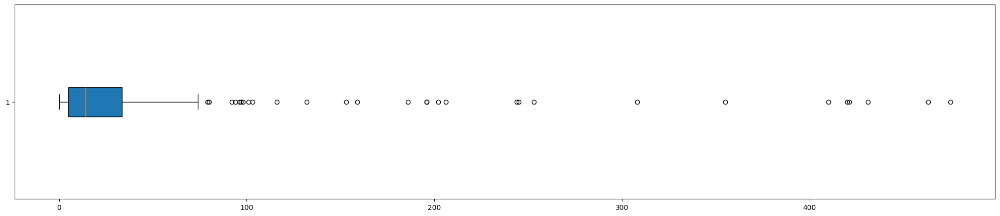

In [ ]:
distribution_qrels(query_id, r1, "relevance = 1")

The third boxplot focuses on documents with a relevance of 2, highlighting a distribution strongly concentrated toward the lower end. The average is just 1.78 documents per query, while the median is 0, meaning that more than half of the queries have no relevant documents with a relevance of 2. This contrasts sharply with the first two boxplots, where the mean and median values were significantly higher. The total range is much narrower, varying from 0 to a maximum of 21 relevant documents. The quartile distribution reflects this concentration toward lower values: the first quartile is 0, the third quartile is 2, and the interquartile range is just 2 documents.

Outliers are particularly significant in this distribution. Values above 5 relevant documents are considered outliers, and 36 queries fall into this category. This number of outliers, while higher than in the first two boxplots, represents a larger fraction of the overall distribution, given the scarcity of documents with a relevance of 2. The distribution is strongly right-skewed, with most queries showing 0 relevant documents and a limited number producing higher values. This pattern underscores the rarity of documents with high relevance, which are concentrated in a few specific queries.

The presence of a median of 0 and such a reduced IQR, along with the other factors, confirms that the relevance classification of 2 is assigned with much more selective criteria compared to relevance 1, making it extremely specific. The scarcity of documents with high relevance may reflect a dataset structure where documents that are truly central to a query are few and difficult to identify.

Numerical Values (relevance = 2)



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,1.783282,21,0,0.0,0.0,0.0,2.0,21.0,2.0,-3.0,5.0,0.0,36.0,36.0
ID,NaN,PLAIN-2630,PLAIN-1008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Boxplot (relevance = 2)



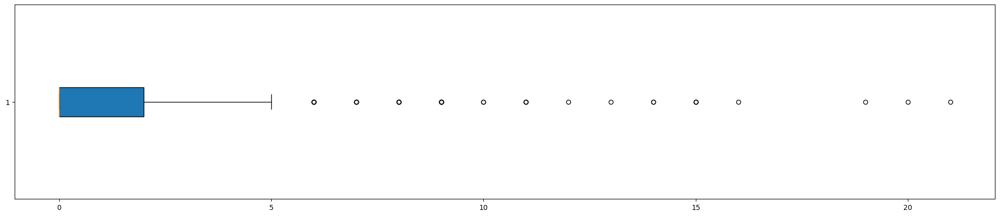

In [ ]:
distribution_qrels(query_id, r2, "relevance = 2")

The joint analysis of the graphs reveals a clear hierarchy in the distribution of relevant documents based on the level of relevance. In the global case, the distribution is broad and influenced by outliers, with the majority of values concentrated at medium to low levels. When focusing on documents with a relevance level of 1, a similar but narrower distribution is observed, indicating that these documents form the main foundation of relevant documents. Finally, documents with a relevance level of 2 are extremely rare, with a distribution strongly concentrated toward lower values and a relatively high number of outliers, representing exceptional cases.

These observations highlight a system where highly relevant documents are assigned sparingly, while documents with lower relevance make up the majority of the dataset. This behavior might reflect the structure of the reference domain or the evaluation methodology applied, raising interesting questions about the balance between specificity and completeness in defining relevance.

### Analysis of string lengths

#### Document text lengths

The boxplot and numerical values reveal a distribution of document lengths characterized by high variability and the presence of numerous outliers. The average document length is 1496.9 characters, with a median of 1517 characters. This suggests a relatively balanced distribution, although it is influenced by extreme values. The lengths range from a minimum of 90 characters to a maximum of 9939 characters, with 50% of the data (between the first quartile, 1185 characters, and the third quartile, 1769 characters) concentrated within an interquartile range (IQR) of 584 characters.

Outliers play a significant role in this distribution: 56 documents exceed the upper threshold of 2645 characters, while 17 fall below the lower threshold of 309 characters, for a total of 73 atypical values. This indicates a long tail toward higher values, with some exceptionally long documents skewing the distribution.

Overall, the distribution of lengths shows an asymmetric behavior, with a tendency toward higher values. Most documents fall within a reasonably narrow range, but the extreme values suggest a different type of document, likely more complex or content-rich. This necessitates careful consideration of the outliers, especially if statistical analyses or predictive models are to be applied.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,1496.923204,9939,90,90.0,1185.0,1517.0,1769.0,9939.0,584.0,309.0,2645.0,17.0,56.0,73.0
ID,NaN,MED-957,MED-5063,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



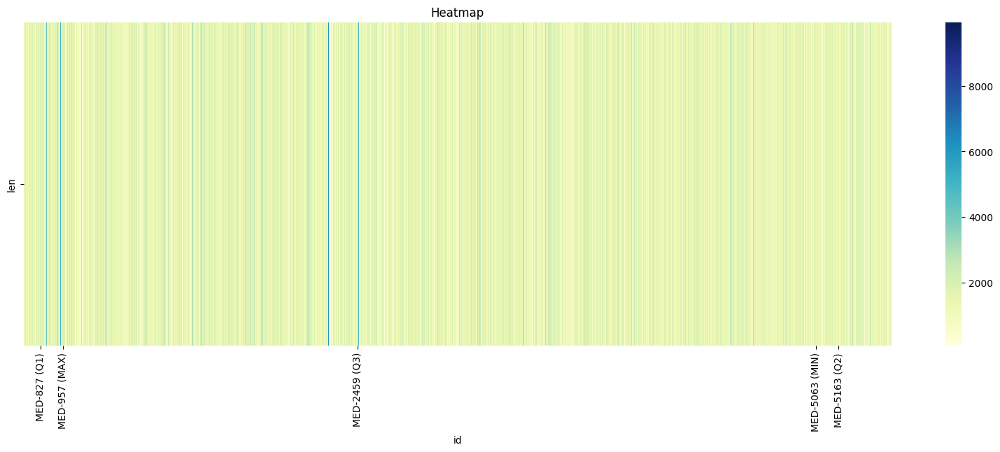


Boxplot 



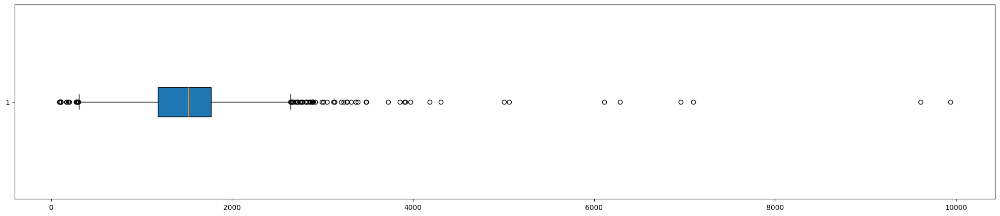

In [ ]:
import seaborn as sns

def show_heatmap(df, label=""):

  if label != "":
    print("\nHeatmap (" + label + ")\n")
  else:
    print("\nHeatmap \n")

  heatmap_data = df.set_index("id").T

  doc_length_sorted = df.sort_values("len")

  min_doc = doc_length_sorted.iloc[0]["id"]
  q1_doc = doc_length_sorted.iloc[int(len(doc_length_sorted) * 0.25)]["id"]
  median_doc = doc_length_sorted.iloc[int(len(doc_length_sorted) * 0.5)]["id"]
  q3_doc = doc_length_sorted.iloc[int(len(doc_length_sorted) * 0.75)]["id"]
  max_doc = doc_length_sorted.iloc[-1]["id"]

  plt.figure(figsize=(20, 6))
  sns.heatmap(heatmap_data, annot=False, cmap="YlGnBu", cbar=True, fmt=".2f")

  x_labels = [min_doc + " (MIN)", q1_doc + " (Q1)", median_doc + " (Q2)", q3_doc + " (Q3)", max_doc + " (MAX)"]

  plt.xticks(
      ticks=[
          df.index[df["id"] == min_doc][0],
          df.index[df["id"] == q1_doc][0],
          df.index[df["id"] == median_doc][0],
          df.index[df["id"] == q3_doc][0],
          df.index[df["id"] == max_doc][0],
      ],
      labels=x_labels,
      rotation=90
  )

  plt.title("Heatmap")
  plt.show()


def distribution_lenghts(dataframe, column=""):

  df = dataframe.copy()

  found1 = False
  found2 = False
  for key in df.keys():
    if "id" in key:
      df.rename(columns={key: "id"}, inplace=True)
      found1 = True
    else:
      if column == key:
        found2 = True

    if found1 and found2:
      break

  df['len'] = df[column].apply(len)
  df = df[['id', 'len']].copy()

  show_statistic(df)
  show_heatmap(df)
  show_boxplot(df)


distribution_lenghts(data_text, 'text')

#### Document title lengths

The boxplot and accompanying numerical analysis reveal that the distribution of document title lengths is moderately concentrated but exhibits asymmetry due to the presence of outliers. The majority of titles fall within a relatively narrow range of 68 to 117 characters, yet the influence of eight upper outliers with significantly greater lengths disrupts the balance of the distribution. This asymmetry is evident in the slight divergence between the median (91 characters) and the mean (92.87 characters), which underscores the impact of extreme values on the overall statistics.

Key observations from the analysis include:  

- Range: title lengths span from a minimum of 10 characters to a maximum of 234 characters, highlighting a notable variation in the dataset.  
- Quartiles: 25% of titles are shorter than 68 characters, and 75% fall below 117 characters, marking the interquartile range (IQR) at 49 characters—a reflection of the relatively compact central distribution.  
- Non-Outlier Range: titles outside the outlier threshold range between 10 and 190 characters, further emphasizing the variability.  
- Outliers: the eight upper outliers, all exceeding 190 characters, introduce significant asymmetry to the distribution, while no lower outliers are observed, as shorter titles remain within the expected bounds.  

Overall, the distribution of title lengths is predominantly uniform, with the majority of data points concentrated within a well-defined central range. However, the influence of upper outliers indicates the presence of exceptionally lengthy titles, likely reflective of unique or more descriptive content.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,92.860721,234,10,10.0,68.0,91.0,117.0,234.0,49.0,-5.5,190.5,0.0,8.0,8.0
ID,NaN,MED-4499,MED-3800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



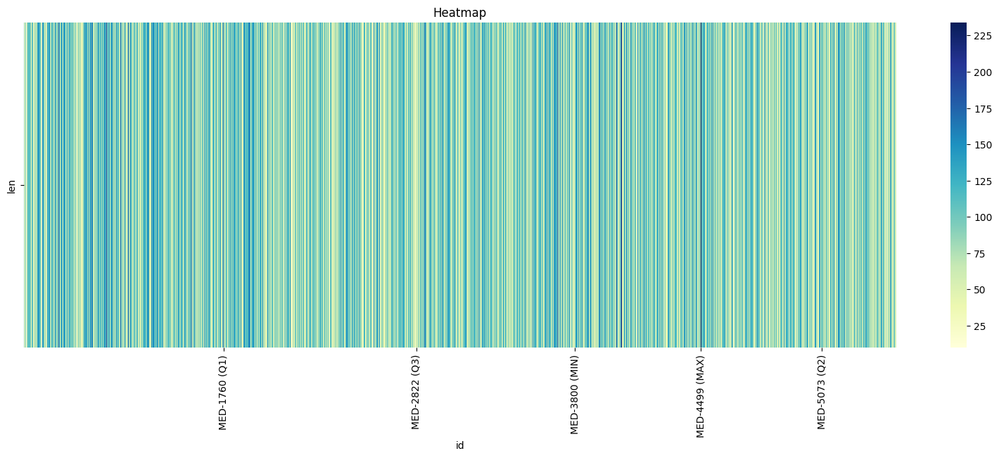


Boxplot 



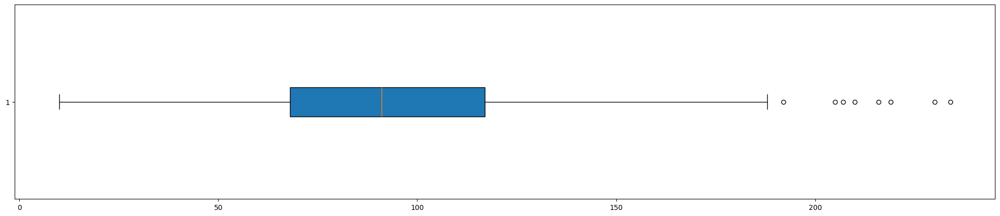

In [ ]:
distribution_lenghts(data_title, 'title')

#### Query text lengths

The boxplot and statistical analysis of `queries` reveal an asymmetric distribution of text lengths, characterized by a long tail toward higher values. While most queries are relatively short, ranging between 9 and 33 characters (excluding outliers), a few significantly longer queries contribute to the observed skewness.

Key observations include:  

- Outliers: two queries exceed 69 characters, marking them as outliers in the distribution. No lower outliers are detected, as the theoretical lower limit of -27 characters is not feasible for text length.  
- Range: query lengths vary from a minimum of 3 characters to a maximum of 72 characters, demonstrating considerable diversity in lengths.  
- Central Concentration: the majority of queries fall within the range of 9 to 33 characters, indicating that shorter queries dominate the dataset.  
- Interquartile Range (IQR): the IQR, spanning from the first quartile (9 characters) to the third quartile (33 characters), measures 24 characters, reflecting moderate variability within the central portion of the data.  
- Descriptive Statistics: the mean query length is 21.76 characters, while the median is 18 characters, further illustrating the skewed nature of the distribution caused by the longer queries.

Overall, the distribution of query text lengths is heavily centered around short values, with a minority of outliers extending the tail toward higher lengths. These findings suggest that while most queries are concise, the presence of longer queries may reflect more specific or detailed user inputs, which could influence subsequent analysis or system performance.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,21.764706,72,3,3.0,9.0,18.0,33.0,72.0,24.0,-27.0,69.0,0.0,2.0,2.0
ID,NaN,PLAIN-2960,PLAIN-741,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



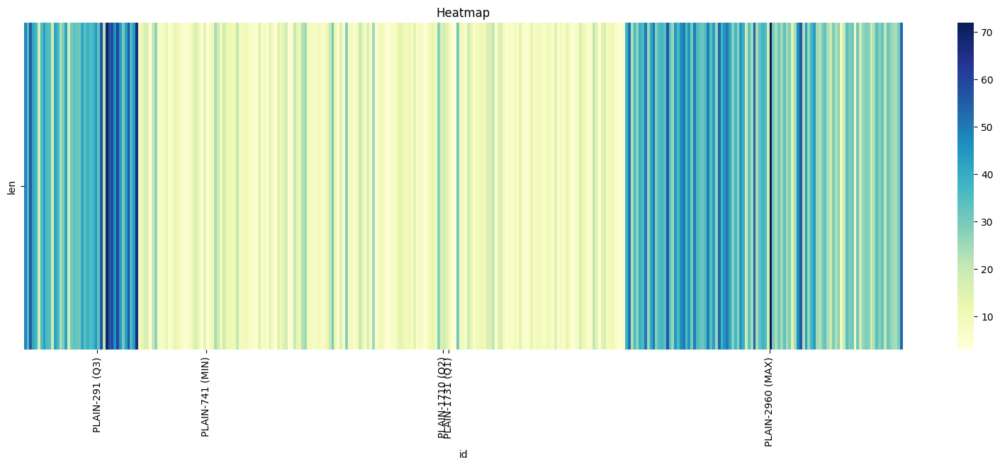


Boxplot 



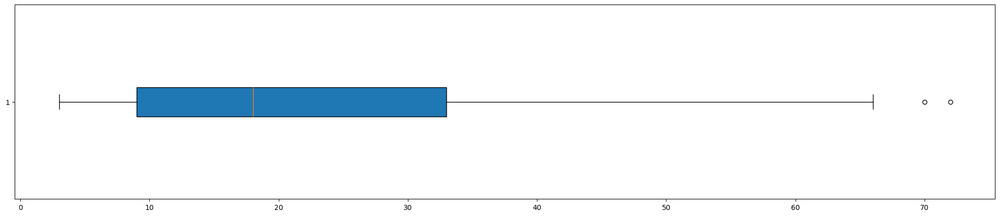

In [ ]:
distribution_lenghts(queries, 'query_text')

### Analysis Characters

Regarding the characters that make up the text, the considerations are simple.The histogram illustrates the frequency distribution of characters within the text corpus, which, as a reminder, is in English. The most frequent character is, unsurprisingly, the space, represented by the highest peak. This is expected, as spaces are essential for separating words and are therefore the dominant character in any text.

Among alphabetic characters, lowercase letters are more frequent than uppercase ones, consistent with the natural use of written English, where uppercase letters are used primarily at the beginning of sentences, for proper nouns, or in acronyms. Among lowercase letters, some such as 'e,' 't,' 'a,' 'o,' 'n,' 'i,' and 's' appear particularly frequently, aligning with linguistic statistics that identify 'e' as the most common letter in the English language.

Numbers and symbols occur much less frequently than alphabetic characters. This reflects the fact that narrative or descriptive texts rarely use these elements. Punctuation marks, such as periods, commas, and others, are present but less common than letters. Among these, the period and comma are generally the most frequent.

There are in the corpus also special characters, such as accented ones ('á,' 'é,' 'ü') or symbols not typical of English, but they show very low frequency, consistent with their rare appearance in standard English texts. Mathematical symbols or unconventional characters might originate from specific sections of the corpus, such as examples or the use of scientific and/or foreign termstypical for the type of texts of the project theme.

Overall, the histogram reflects the typical characteristics of English texts, with the predominance of spaces and common letters, a moderate presence of punctuation and symbols, and the rarity of unconventional characters.

Number of unique characters:  197 

Detailed frequencies: 



,,!,"""",#,$,%,&,',(,),...,−,∶,∼,≈,≤,≥,≧,≪,⩽,⩾
Frequence,849406,5,698,9,81,6283,103,1372,18180,18292,...,217,2,31,7,43,160,1,1,1,4



Histogram frequencies: 



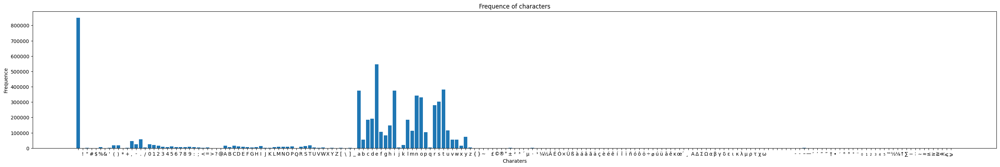

In [ ]:
unique_characters = []

full_text = " ".join(data['text'].tolist() + data['title'].tolist() + queries['query_text'].tolist())

unique_characters = sorted(list(set(full_text)))
frequence_characters = [full_text.count(char) for char in unique_characters]

print("Number of unique characters: ", len(unique_characters), '\n')

print('Detailed frequencies: \n')
df_frequence_characters = pd.DataFrame(frequence_characters, index=unique_characters)
df_frequence_characters.columns = ['Frequence']
display(df_frequence_characters.T)

print('\nHistogram frequencies: \n')
plt.figure(figsize=(35, 5))
plt.bar(unique_characters, frequence_characters)
plt.xlabel('Charaters')
plt.ylabel('Frequence')
plt.title('Frequence of characters')
plt.show()

### Analysis alongside Preprocessing

#### Normalization

The normalization process aims to preprocess text to make it more uniform and consistent for potential analysis. Each step is crucial to address various types of "noise" that the text may contain, thus enhancing the quality of the processing.

1. Removal of URLs: the first operation removes all web links from the text, as URLs are generally not useful for sentiment analysis, classification, or other tasks and may distract the model.

2. Removal of emojis: emojis are graphical symbols that might not be relevant to text analysis. Replacing or removing them makes the text more focused on verbal content.

3. Removal of HTML tags: using `BeautifulSoup` to remove any HTML tags ensures that only the textual content is retained, preventing markup or formatting from influencing text analysis.

4. Unicode normalization: Unicode normalization helps address special characters that may appear in different forms, such as accented letters. The decomposition process (NFD) separates accented characters into two entities: the base letter and the accent, thus simplifying text handling. This prevents the removal of these characters, preserving information, albeit partially.

5. Removal of unnecessary spaces: the `strip()` method removes any unnecessary spaces or newline characters from the beginning or end of the text, preventing them from affecting subsequent analysis.

6. Conversion to lowercase: converting the text to lowercase is crucial to standardize the content, as words written in uppercase or lowercase could be interpreted as distinct entities, whereas the process makes them uniform.

7. Removal of non-alphabetic characters: the final step removes all characters that are not letters, numbers, or white spaces, excluding punctuation marks or symbols that may not be useful for analysis.

It should be noted that some steps are preventive: they are applied even if not strictly necessary, as it is assumed that the input data may vary in the future. Additionally, unlike other preprocessing methods, the decision was made to retain numbers, as they preserved useful information, such as chemical compound names.

Lastly, it can be observed that some steps, such as error correction and removal of all duplicates, were not performed. This choice was made to consider certain essential steps while also ensuring good execution time. Steps like error correction presented extremely long processing times.

These steps are important for preprocessing as they help reduce text variability by removing elements that could confuse algorithms or be insignificant. A normalized text is easier to handle and better suited for machine learning models, as it reduces "noise" and increases the consistency of the information.

In [ ]:
import re
import emoji
from bs4 import BeautifulSoup
from textblob import TextBlob
import string
import unicodedata

def normalization(text):
    '''text = re.sub(r'http[s]?://\S+|www\.\S+', '', text)

    text = emoji.replace_emoji(text, replace='')

    text = BeautifulSoup(text, "html.parser").get_text()

    #text = unicodedata.normalize('NFD', text)

    text = re.sub(r'\s\s+', '', text)
    text = text.strip()

    text = text.lower()

    text = ''.join([char for char in text if (not (char in string.punctuation))])'''

    """
    Normalizza un testo rimuovendo caratteri speciali non necessari,
    mantenendo quelli utili per i sistemi di ricerca.

    :param text: Stringa di input
    :return: Stringa normalizzata
    """

    # Definisci i caratteri speciali da rimuovere
    to_remove = r"[.,:;!?()\[\]{}\\|`~@#^&*\"<>\']"

    # Rimuovi i caratteri definiti sopra
    text = re.sub(to_remove, "", text)

    # Mantieni trattini e underscore solo in termini composti
    text = re.sub(r"(?<!\w)[-_](?!\w)", "", text)

    # Elimina caratteri di controllo eccessivi
    text = re.sub(r"[\x00-\x1F\x7F]", "", text)

    # Trasforma in minuscolo
    text = text.lower()

    # Rimuovi spazi extra
    text = re.sub(r"\s+", " ", text).strip()

    return text


data_text['normalized'] = data_text['text'].apply(normalization)
data_title['normalized'] = data_title['title'].apply(normalization)
queries['normalized'] = queries['query_text'].apply(normalization)


Regarding the distributions of normalized text lengths, there isn't much to highlight. The impact of normalization was not particularly significant overall, especially for titles and queries, where it can almost be considered negligible. The observed variations are minimal, with more noticeable changes only in documents, where there was a reduction in both the average and maximum lengths and a slight increase in the number of outliers. In fact, extreme outliers appear slightly closer to the central box in the normalized version, indicating that longer and more complex texts often include non-standard characters.  

Details:

- Document Texts: normalization had a noticeable impact only on the document texts, with a reduction in average length from 1496.9 to 1449.4, indicating a general shortening of the texts. The maximum value also decreased from 9939 to 9686, showing that the longest documents were compressed. However, the minimum value remained unchanged at 90, suggesting that the shortest documents were not significantly affected. The quartiles showed a slight decrease: for instance, the median dropped from 1517 to 1467. This suggests that the overall distribution shifted toward shorter lengths. The reduction in IQR (from 584 to 554) confirms greater compactness in the distribution. Despite this, the total number of outliers increased from 73 to 81, with an increase in both lower outliers (from 17 to 23) and upper outliers (from 56 to 58). The IDs associated with the extremes, MED-957 for the minimum and MED-5063 for the maximum, did not change.  

- Document Titles: the effect of normalization on titles was minimal. The average length slightly decreased from 92.8 to 91.0, and the maximum value dropped from 234 to 230, showing only a marginal reduction for longer titles. The minimum value changed slightly, from 10 to 9. Quartiles and IQR showed negligible variations, with the median dropping from 91.0 to 89.0. Despite normalization, the number of outliers remained unchanged at 8, indicating that the extremes of the distribution were not affected. Similarly, the IDs associated with the extremes, MED-4499 for the minimum and MED-3800 for the maximum, remained unchanged.

- Queries: showed the smallest impact from normalization. The average length decreased by just 0.3, from 21.7 to 21.4, and the maximum value dropped slightly from 72 to 70. The minimum value, at 3, remained unchanged. Quartiles and IQR were nearly unaffected, with insignificant changes in the overall distribution. The number of outliers, which was 2 both before and after normalization, was not affected. The IDs associated with the extremes, PLAIN-2960 for the minimum and PLAIN-741 for the maximum, also remained unchanged.  

---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,1455.339389,9715,90,90.0,1157.0,1473.0,1716.0,9715.0,559.0,318.5,2554.5,22.0,59.0,81.0
ID,NaN,MED-957,MED-5063,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



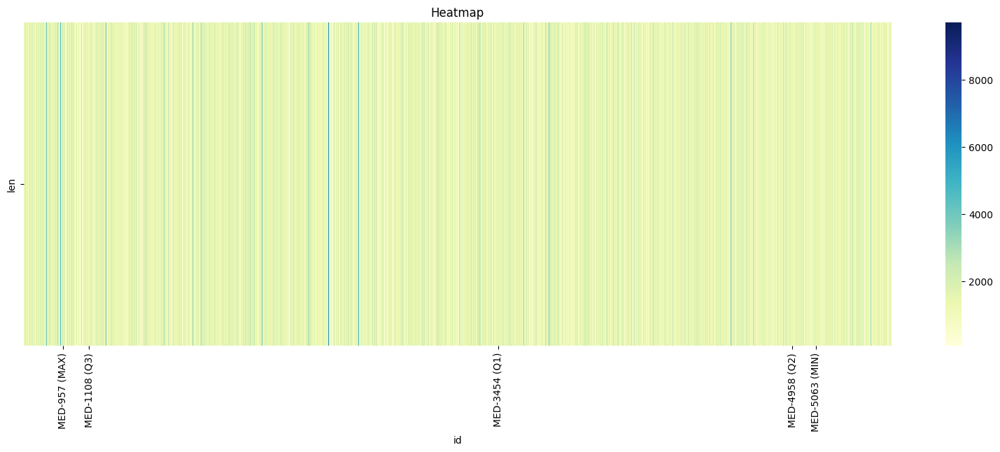


Boxplot 



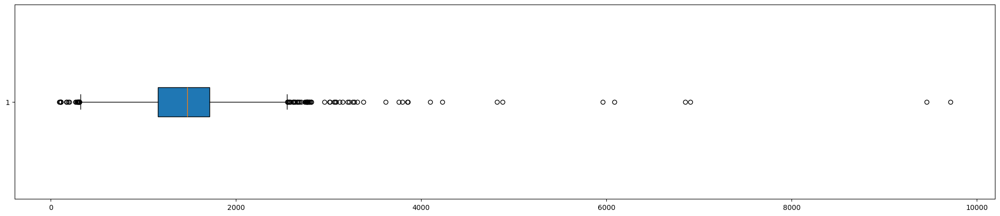


Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,91.062208,230,9,9.0,67.0,89.0,115.0,230.0,48.0,-5.0,187.0,0.0,8.0,8.0
ID,NaN,MED-4499,MED-3800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



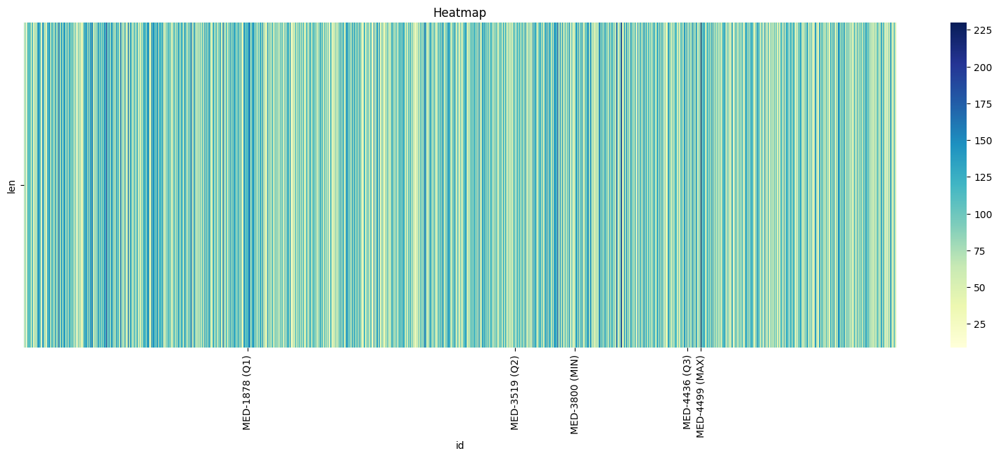


Boxplot 



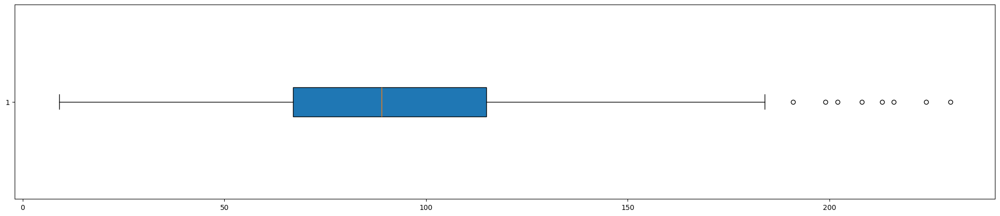


Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,21.495356,70,3,3.0,9.0,17.0,32.0,70.0,23.0,-25.5,66.5,0.0,2.0,2.0
ID,NaN,PLAIN-2960,PLAIN-741,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



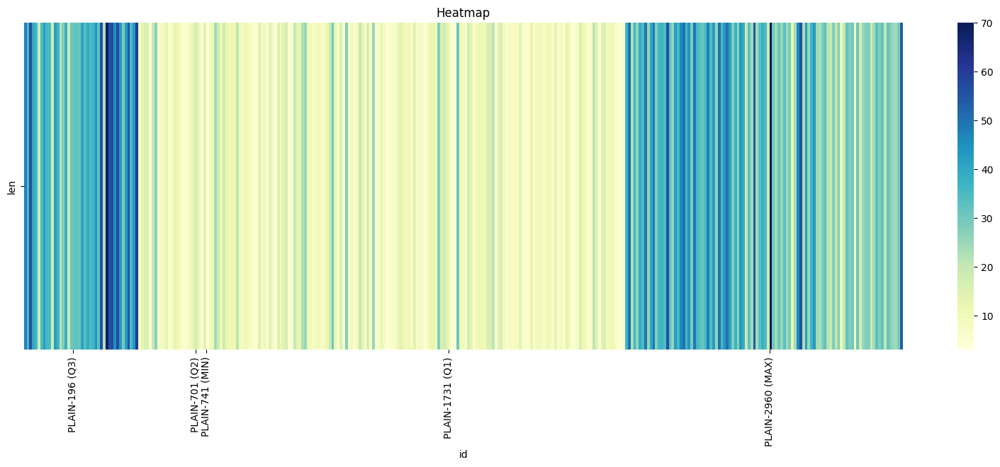


Boxplot 



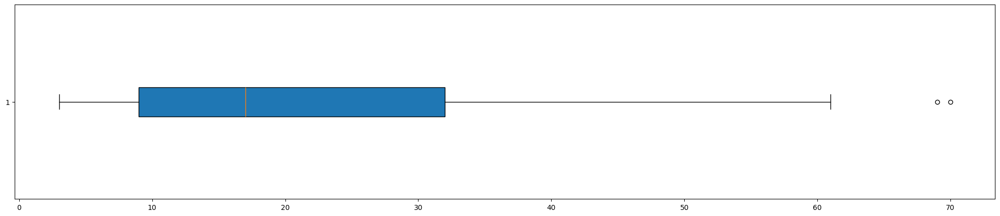

In [ ]:
def multiple_distribution_lenghts(column="", df1=data_text, df2=data_title, df3=queries):

  distribution_lenghts(df1, column)
  print()
  distribution_lenghts(df2, column)
  print()
  distribution_lenghts(df3, column)

multiple_distribution_lenghts('normalized')

#### Tokenization

Tokenization is a process that breaks down text into smaller units called "tokens" (such as words or symbols). It is a crucial step in natural language preprocessing because it makes text analysis easier by transforming a complex string into a sequence of elements that can be examined separately. Each token represents a meaningful part of the text, such as a word, punctuation mark, or symbol, which can be analyzed individually.

In this specific case, the process applies tokenization to three datasets (text, titles, and queries) that have already been normalized, using the `word_tokenize` function. This NLTK function splits the text into tokens by separating words based on spaces and punctuation marks. It operates by following specific rules to identify words and significant character sequences, while also considering linguistic peculiarities such as punctuation, contractions, and other language-specific anomalies.

In [ ]:
import nltk
nltk.download('punkt_tab')

def tokenize(text):
  #return word_tokenize(text)
  return text.split()

data_text['tokens'] = data_text['normalized'].apply(tokenize)
data_title['tokens'] = data_title['normalized'].apply(tokenize)
queries['tokens'] = queries['normalized'].apply(tokenize)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Examining the corpus through tokens reveals that it consists of 36,735 unique tokens, while the total number of tokens is 843,048. This highlights, as expected, significant repetition of terms. The nature of the corpus, characterized by recurring terms, reflects specific themes and a consistent lexicon, as is common in specialized texts or scientific articles.

In [ ]:
full_dict = {}

def number_info(column=""):
  text = data_text[column].tolist()
  text = [item for sublist in text for item in sublist]

  title = data_title[column].tolist()
  title = [item for sublist in title for item in sublist]

  query = queries[column].tolist()
  query = [item for sublist in query for item in sublist]

  full = text + title + query

  full_dict[column] = full

  unique = list(set(full))

  print("Number of " + column + " in document texts: " + str(len(text)))
  print("Avarage " + column + " for document texts: " + str(len(text) / len(data_text)))

  print("\nNumber of " + column + " in document titles: " + str(len(title)))
  print("Avarage " + column + " for document titles: " + str(len(title) / len(data_title)))

  print("\nNumber of " + column + " in queries: " + str(len(query)))
  print("Avarage " + column + " for queries: " + str(len(query) / len(queries)))

  print("\nNumber of total " + column + ": " + str(len(full)))
  print("Number of unique " + column + ": " + str(len(unique)))
  print()

number_info('tokens')

Number of tokens in document texts: 801377
Avarage tokens for document texts: 220.58271401045968

Number of tokens in document titles: 46396
Avarage tokens for document titles: 12.770712909441233

Number of tokens in queries: 1057
Avarage tokens for queries: 3.2724458204334366

Number of total tokens: 848830
Number of unique tokens: 39635



The wordclouds provide a visual analysis of the token distribution, revealing that the most frequent terms include "patient", "effect", "result", "diet", and "level". This confirms that the corpus focuses on scientific themes, likely related to medicine, health, and clinical research. The prominence of these terms suggests that the corpus consists of articles or studies exploring medical interventions, research results, and health-related factors.

In addition to the main terms, secondary words like "cancer", "risk", "treatment", "intake", and "exposure" appear, indicating a focus on the analysis of risks, benefits, and impacts of treatments, diet, and exposures to specific factors. The presence of terms like "study" and "method" highlights the scientific nature of the corpus, which likely includes descriptions of research methodologies, comparative studies, and empirical analyses.

The wordcloud based on raw tokens shows all words in their original form. This representation is useful for identifying the frequency of words in their natural form, but also highlights some limitations: morphological variants (e.g., "associated" and "associating") appear separately, creating redundancies. Moreover, the large number of unique tokens and the limited image size prevent the visualization of many less frequent words.

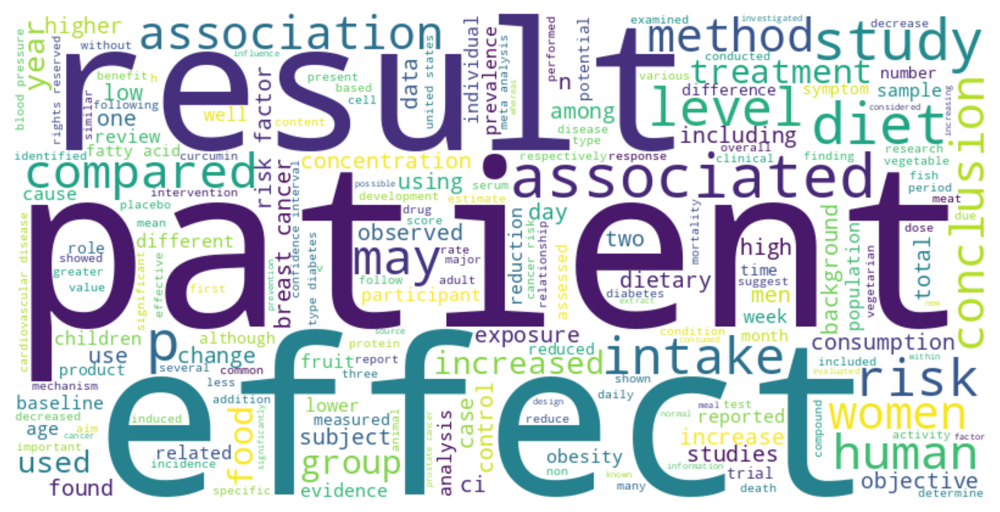

In [ ]:
from wordcloud import WordCloud

def show_wordcloud(column):
  full = data_text[column].tolist() + data_title[column].tolist() + queries[column].tolist()
  full = [item for sublist in full for item in sublist]

  wordcloud = WordCloud(stopwords=None, width=800, height=400, background_color='white').generate(" ".join(full))

  plt.figure(figsize=(10, 5), dpi=300)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.show()

show_wordcloud('tokens')

Regarding the distribution of tokens, it can be observed that, in general, the distribution compared to that of the normalized text lengths, although on different value scales, is not substantially different. However, it can be noted that:
- In the documents, tokenization increases the number of outliers. Although there are already more upper outliers (long documents) than lower ones (short documents), tokenization seems to further expand the distribution, adding more upper outliers (69 vs. 58) and a greater number of total outliers (89 vs. 81). This suggests that, when tokenizing texts, particularly long documents in terms of tokens become even more prominent.
- In the titles, tokenization slightly reduces the outliers, but the number of outliers remains low. Although there are few long titles in terms of characters or tokens, the reduction in upper outliers (from 8 to 7) suggests that tokenization has a slight tendency to reduce longer titles (in terms of tokens).
- In queries, tokenization completely eliminates the outliers. While in the normalized version (characters) there are 2 upper outliers (long queries), the tokenized version has no outliers, indicating that tokenization has reduced or eliminated cases of queries that were relatively long.

Looking at the averages, it can be said that in all categories, the tokens are made up on average of about 6.6-7.1 characters per token. This is quite significant as it confirms that tokens are not particularly short (e.g., single letters or very short words), but rather consist of longer text portions, such as whole words or segments of words. In particular:
- The average number of characters per token in the documents is:

$$ \frac{1449.4 \, \text{characters}}{219.3 \, \text{tokens}} \approx 6.6 \, \text{characters per token} $$

- The average number of characters per token in the titles is:

$$ \frac{91.0 \, \text{characters}}{12.8 \, \text{tokens}} \approx 7.1 \, \text{characters per token} $$

- The average number of characters per token in the queries is:

$$ \frac{21.4 \, \text{characters}}{3.2 \, \text{tokens}} \approx 6.7 \, \text{characters per token} $$


Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,220.582714,1459,13,13.0,173.0,223.0,257.0,1459.0,84.0,47.0,383.0,22.0,67.0,89.0
ID,NaN,MED-957,MED-1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



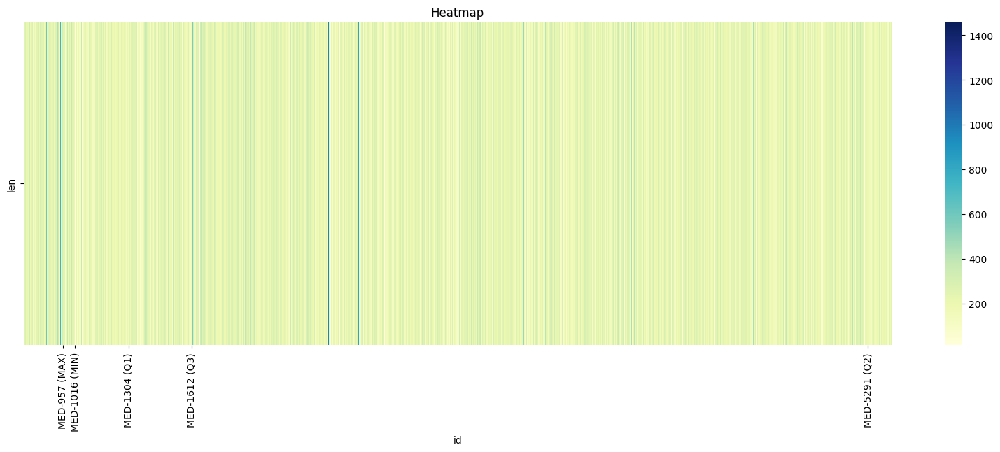


Boxplot 



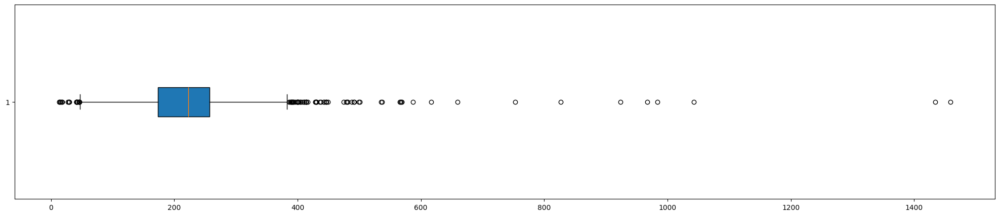


Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,12.770713,34,1,1.0,9.0,13.0,16.0,34.0,7.0,-1.5,26.5,0.0,6.0,6.0
ID,NaN,MED-5293,MED-557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



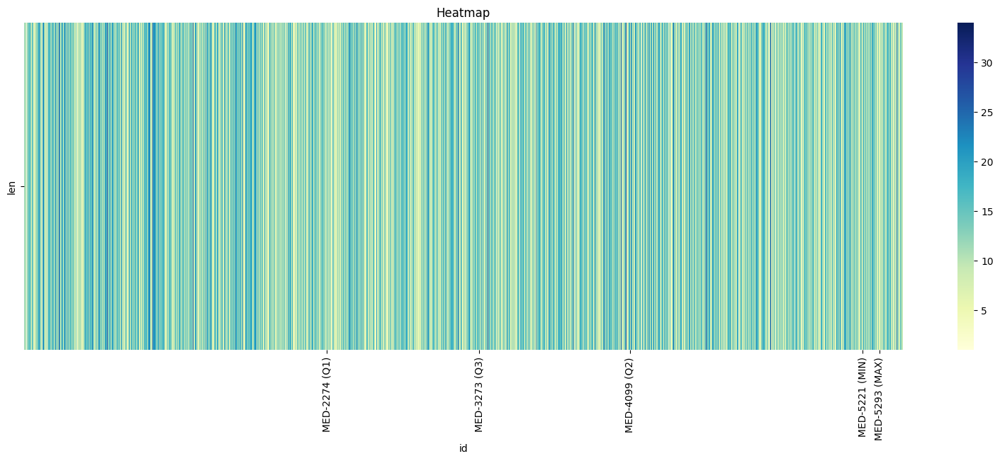


Boxplot 



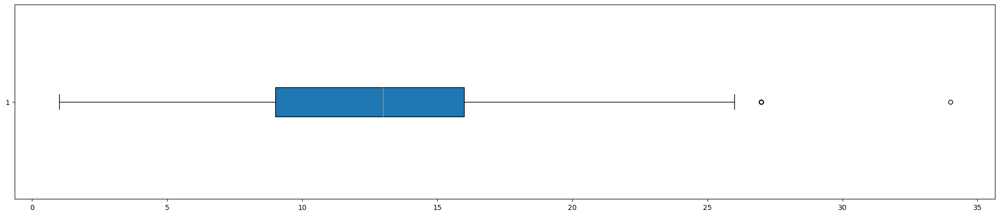


Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,3.272446,11,1,1.0,1.0,2.0,5.0,11.0,4.0,-5.0,11.0,0.0,0.0,0.0
ID,NaN,PLAIN-383,PLAIN-478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



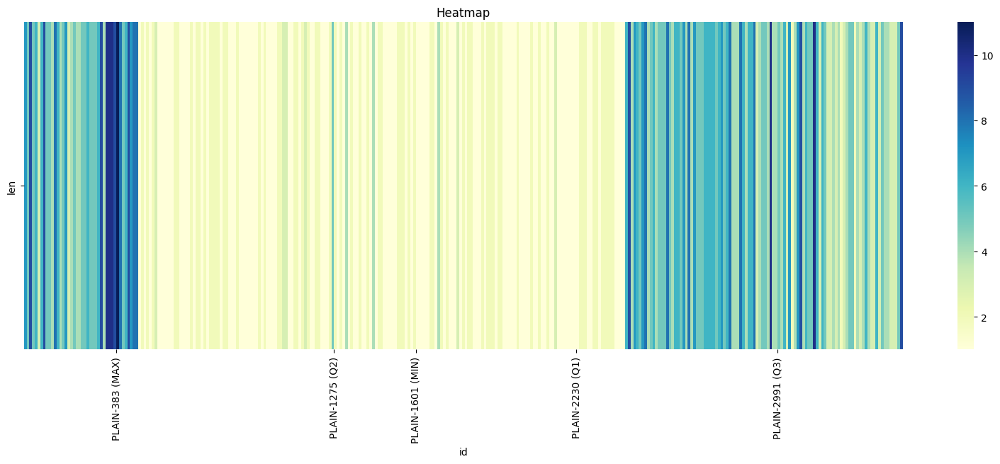


Boxplot 



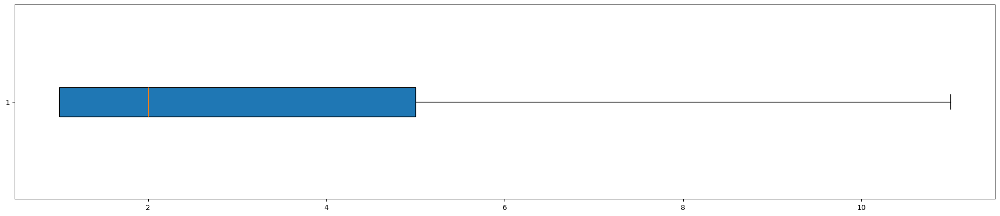

In [ ]:
multiple_distribution_lenghts('tokens')

#### Sentence split

Sentence tokenization is a process used in natural language processing (NLP) to break continuous text into smaller units, i.e., sentences.

A tokenization analysis for sentences is useful because it allows you to better understand and more effectively treat text within a natural language processing (NLP) system. In fact, sentences are more complete units of meaning than individual words. When text is properly broken down into sentences, it makes it easier to analyze context, tone, and relationships between concepts, which would not be possible if the text were treated as a continuous stream of words.

In [ ]:
from nltk.tokenize import sent_tokenize

nltk.download('punkt_tab')

def tokenize_sent(text):
  return sent_tokenize(text)

data_text['sentence-tokens'] = data_text['text'].apply(tokenize_sent)
data_title['sentence-tokens'] = data_title['title'].apply(tokenize_sent)
queries['sentence-tokens'] = queries['query_text'].apply(tokenize_sent)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
number_info('sentence-tokens')

Number of sentence-tokens in document texts: 35130
Avarage sentence-tokens for document texts: 9.669694467382328

Number of sentence-tokens in document titles: 3763
Avarage sentence-tokens for document titles: 1.0357830993669144

Number of sentence-tokens in queries: 325
Avarage sentence-tokens for queries: 1.0061919504643964

Number of total sentence-tokens: 39218
Number of unique sentence-tokens: 38277



Through the analysis of histograms and boxplots related to the distribution of the number of sentences per document, significant insights can be drawn. Examining the length of the documents reveals a fairly broad distribution. The median sits at around 10 sentences, indicating that many documents are of moderate length, such as short blog articles or informational posts. However, the wider interquartile range of 5 and the presence of numerous outliers suggest a high degree of heterogeneity in the data. This diversity is further highlighted by the fact that the maximum number of sentences per document is 69, while the minimum is 1.  

This variety can be attributed to the diverse nature of the analyzed documents, ranging from concise content, like brief news updates, to more elaborate and detailed texts, such as technical reports or in-depth guides. The outliers, reaching up to 70 sentences or more, represent extremely long and complex documents, typical of white papers, research reports, or structured academic papers. For instance, the document with the highest number of sentences (69 - MED-1028) is a detailed scientific paper about Faecal Retention in the Colon, while the shortest document is merely a statement about Linaclotide.  

The presence of such extreme cases reflects a corpus that includes both brief and straightforward content as well as texts aimed at an expert audience requiring greater depth.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,9.669694,69,1,1.0,7.0,10.0,12.0,69.0,5.0,-0.5,19.5,0.0,38.0,38.0
ID,NaN,MED-1028,MED-1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



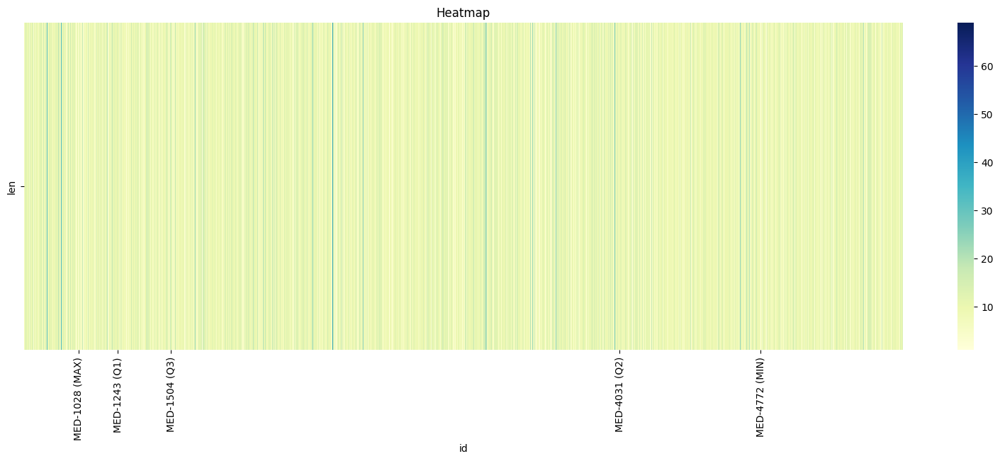


Boxplot 



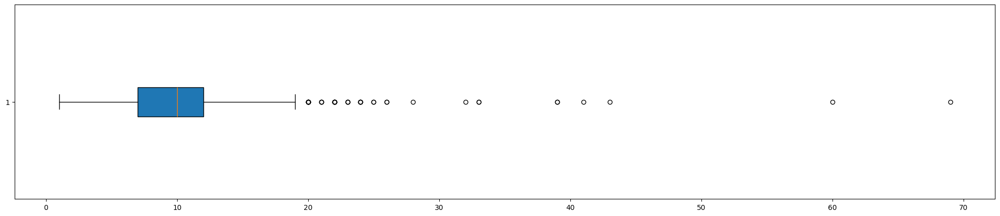

In [ ]:
distribution_lenghts(data_text, 'sentence-tokens')

The second set of charts analyzes the length of titles, measured in terms of tokenized sentences. Unlike the main text of documents, a strong concentration around a single sentence emerges here. This characteristic is unsurprising, as titles are designed to be concise and to quickly convey the content of the document. The observed uniformity often stems from established conventions across various contexts, such as academic articles or web content, where titles must be clear and immediately understandable. Moreover, publication platforms and content management systems frequently impose length restrictions, further encouraging brevity.  

Examining the charts reveals slight variability, with several outliers extending up to four sentences (many of which overlap in the boxplot). A closer look at these cases shows that in many instances, the variability is due to tokenization errors caused by the use of periods for abbreviations or shortened forms. However, some titles genuinely consist of multiple sentences. It was observed that in many of these cases, one of the sentences in the title is a question, with the answer provided in the document itself (e.g., "Dangerous nutrition? Calcium, vitamin D, and shark cartilage nutritional supplements and cancer-related hypercalcemia.").  

These longer titles are more common in academic or technical contexts, where providing additional detail in the title is often intended to attract a specialized audience. While less frequent, such cases demonstrate that titles can adapt to specific needs while still adhering to general expectations of conciseness.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,1.035783,4,1,1.0,1.0,1.0,1.0,4.0,0.0,1.0,1.0,0.0,123.0,123.0
ID,NaN,MED-2617,MED-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



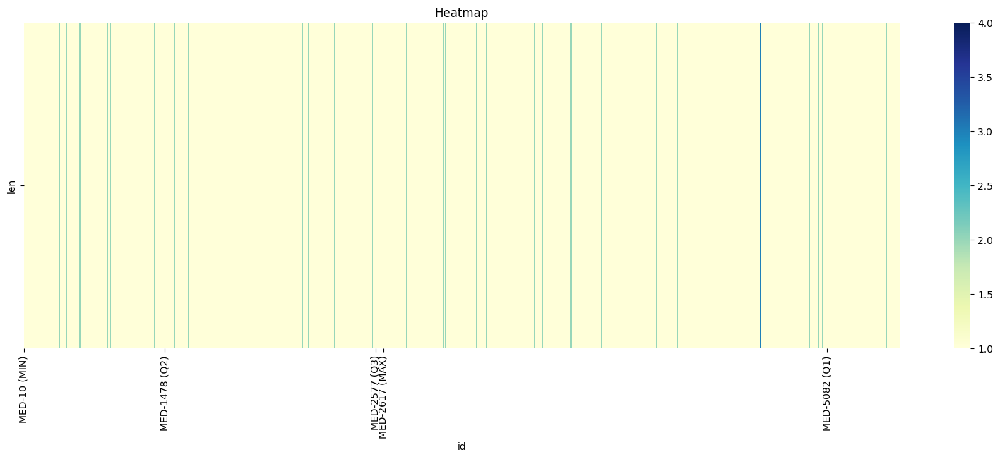


Boxplot 



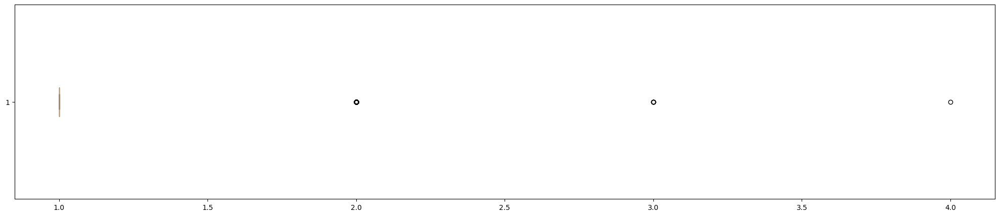

In [ ]:
distribution_lenghts(data_title, 'sentence-tokens')

The third set of charts displays the distribution of query lengths, measured in tokenized sentences. Most queries are extremely short, with a median length of approximately one sentence. This suggests that users tend to formulate concise requests. The observed brevity can be attributed to several factors: the need to save time, especially when using mobile devices; the design of search systems, which often encourage short questions to minimize ambiguity; and the general human tendency toward "laziness" in communication.  

However, the distribution analysis reveals the presence of two outliers. A detailed examination shows that these outliers arise not from genuine multi-sentence queries but from the use of periods in a different context than as sentence separators. The two queries in question are:  
- *The Actual Benefit of Diet vs. Drugs*  
- *Treating Asthma With Plants vs. Supplements?*  

In both cases, the use of the period in "vs." (an abbreviation for "versus") introduces noise into the analysis. This highlights the challenges posed by tokenization errors in accurately analyzing query length distributions.

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,1.006192,2,1,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,0.0,2.0,2.0
ID,NaN,PLAIN-2490,PLAIN-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Heatmap 



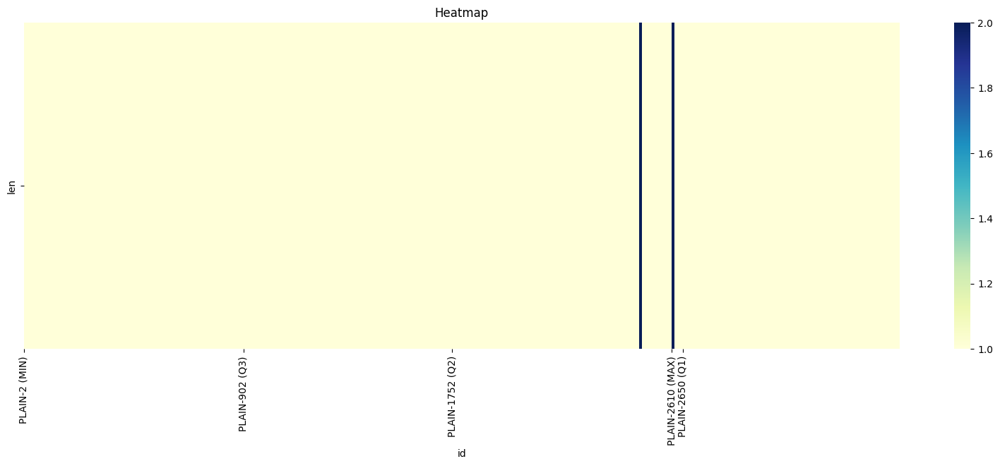


Boxplot 



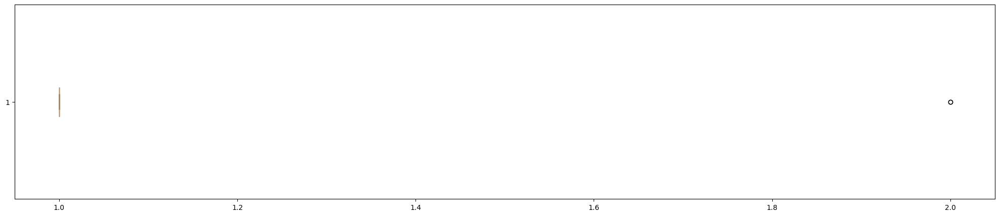

In [ ]:
distribution_lenghts(queries, 'sentence-tokens')

In conclusion, the overall distribution highlights the following key points:  

- The standard length of queries is predictable and standardized.  
- There is a need for systems capable of handling predominantly short and standardized titles while also accommodating the few cases where titles are longer and more descriptive. These longer titles should be leveraged for richer, more contextualized analysis.  
- The need for adaptability to the varying lengths of documents.  

The overall distribution suggests that systems must efficiently manage predominantly short documents, titles, and queries, enabling rapid information extraction. At the same time, they should be equipped with more advanced techniques to handle longer texts, ensuring flexibility to adapt to the occasional, slightly more expansive exceptions.

#### Part-of-speech Tagging

Part-of-Speech tagging (POS tagging) is a linguistic analysis process that assigns each word in a text its grammatical role (e.g., noun, verb, adjective) based on the context. By analyzing the frequency of tags, valuable insights can be gained about the syntactic structure of the text, linguistic style, and the use of grammatical categories. These insights are particularly useful in fields such as computational linguistics and natural language processing.

POS tagging is useful for search engines because it helps to better understand the meaning of queries and the context of words, improving the interpretation of user intent. Additionally, it facilitates semantic indexing and matching queries with relevant content, contributing to delivering more accurate and relevant results.

In [ ]:
from nltk import pos_tag

nltk.download('averaged_perceptron_tagger_eng')

def pos_tagging(text):
  return [tag[1] for tag in pos_tag(text)]

data_text['pos-tags'] = data_text['tokens'].apply(pos_tagging)
data_title['pos-tags'] = data_title['tokens'].apply(pos_tagging)
queries['pos-tags'] = queries['tokens'].apply(pos_tagging)

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


By analyzing the data, we can observe that the total number of tokens matches exactly with the number of POS-tags (part-of-speech tags) in the texts, titles, and queries. This suggests that each token has been analyzed and assigned a corresponding POS-tag.

In [ ]:
number_info('pos-tags')

Number of pos-tags in document texts: 801377
Avarage pos-tags for document texts: 220.58271401045968

Number of pos-tags in document titles: 46396
Avarage pos-tags for document titles: 12.770712909441233

Number of pos-tags in queries: 1057
Avarage pos-tags for queries: 3.2724458204334366

Number of total pos-tags: 848830
Number of unique pos-tags: 36



Analyzing the histograms representing the distribution of Part-of-Speech (POS) tags in scientific or medical documents in English, the observations are fairly straightforward and predictable:

- Common nouns (NN), proper nouns (NNP), and plural nouns (NNS) are among the most frequent tags. This is expected in English texts, as nouns often represent the main subjects and objects of a narrative or discourse.
- Determiners (DT) are also prominently present, reflecting the use of articles and other common grammatical structures in English.
- Verbs (VB, VBD, VBG, etc.) are frequent as well, highlighting the need to describe processes, actions, or phenomena.
- Prepositions (IN) have a significant presence, consistent with the need to describe spatial, temporal, or conceptual relationships in technical texts.
- Other tags, such as FW (Foreign Words) and TO (infinitive marker), are less frequent, indicating a more focused use of scientific language in a straightforward and less mathematical manner.

Overall, the distribution reflects the typical language usage in medical or scientific texts, where the description of concepts, processes, and relationships dominates the linguistic composition.

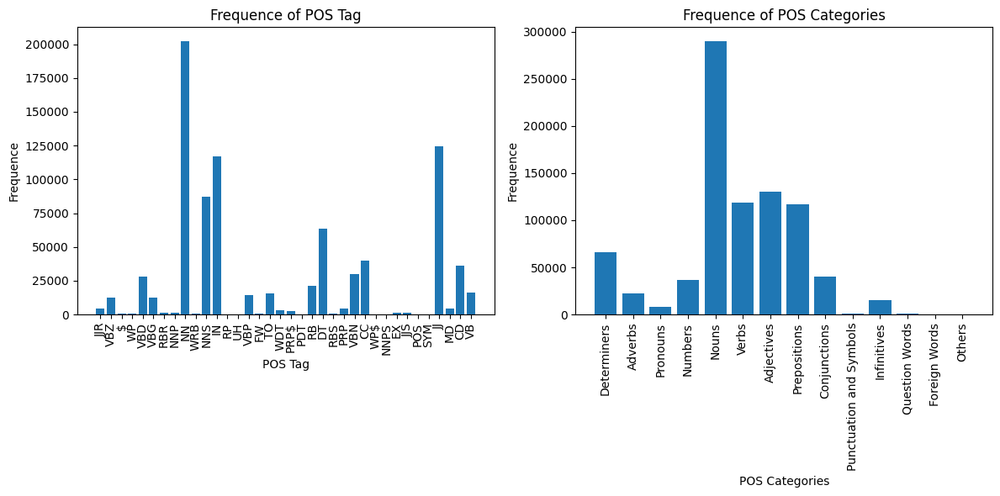

In [ ]:
def simple_frequence(tag, frequence):

  pos_categories = {
      'Determiners': ['DT', 'PDT', 'WDT'], 'Adverbs': ['RBR', 'RBS', 'RB'],
      'Pronouns': ['PRP$', 'PRP', 'WP$', 'WP'], 'Numbers': ['CD'],
      'Nouns': ['NNS', 'NNP', 'NN', 'NNPS'],
      'Verbs': ['VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ', 'MD'],
      'Adjectives': ['JJ', 'JJR', 'JJS'], 'Prepositions': ['IN'],
      'Conjunctions': ['CC'],
      'Punctuation and Symbols': ['POS', 'SYM', 'RP', 'UH', 'EX'],
      'Foreign Words': ['FW'],
      'Infinitives': ['TO'], 'Question Words': ['WRB'],
  }

  pos_frequence = {
        'Determiners': 0, 'Adverbs': 0, 'Pronouns': 0, 'Numbers': 0,
        'Nouns': 0, 'Verbs': 0, 'Adjectives': 0, 'Prepositions': 0,
        'Conjunctions': 0, 'Punctuation and Symbols': 0, 'Infinitives': 0,
        'Question Words': 0, 'Foreign Words': 0, 'Others': 0
  }

  for i in range(len(tag)):
    for key, value in pos_categories.items():
      if tag[i] in value:
        pos_frequence[key] += frequence[i]

  return pos_frequence

full_tag = full_dict['pos-tags']

unique_tag = list(set(full_tag))

frequence_tag = [full_tag.count(tag) for tag in unique_tag]
categories = simple_frequence(unique_tag, frequence_tag)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].bar(unique_tag, frequence_tag)
axs[0].set_xlabel('POS Tag')
axs[0].tick_params(axis='x', rotation=90)
axs[0].set_ylabel('Frequence')
axs[0].set_title('Frequence of POS Tag')

axs[1].bar(categories.keys(), categories.values())
axs[1].set_xlabel('POS Categories')
axs[1].tick_params(axis='x', rotation=90)
axs[1].set_ylabel('Frequence')
axs[1].set_title('Frequence of POS Categories')

plt.tight_layout()
plt.show()

The analysis of the length distribution in this case is not performed as it corresponds identically to the token distribution (like the considerations about the number of tags).

#### Lemmatization

Lemmatization is a word normalization process that reduces words to their lemma, that is, their base or canonical form, such as "run" instead of "running" or "ran." This is useful for reducing linguistic variability, so that words with the same meaning are treated as the same entity, improving text analysis. The advantages of lemmatization include:

1. Uniformity: it reduces words to their base form, treating variants as the same entity (e.g., "ran" and "run").
2. Precision: it eliminates grammatical variations, improving meaning analysis.
3. Efficiency: it simplifies the text, reducing complexity during processing.
4. Dimensionality reduction: fewer variants of the same word, improving machine learning models and search.

In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

def lemmatize(text):
  lemm_text = [lemmatizer.lemmatize(word) for word in text]
  return lemm_text

data_text['lemmas'] = data_text['tokens'].apply(lemmatize)
data_title['lemmas'] = data_title['tokens'].apply(lemmatize)
queries['lemmas'] = queries['tokens'].apply(lemmatize)

[nltk_data] Downloading package wordnet to /root/nltk_data...


Examining the corpus through lemmas reveals that it consists of 35,584 unique lemmas. This shows a significant reduction in the number of unique units compared to the raw tokens, which highlights the effect of lemmatization in consolidating different forms of the same word. The comparison between unique token and lemma highlights, as is logical to expect, the enormous use of the same terms, but in different forms. The nature of the corpus, now characterized by unified forms (e.g., "associated" and "associating" are reduced to "associate"), continues to reflect specific themes and a consistent lexicon. This is typical of scientific texts, where repeated terms, now in their lemma form, emphasize central topics and concepts. Lemmatization helps to highlight the core vocabulary and reduces redundancy, making the analysis more focused.

In [ ]:
number_info('lemmas')

Number of lemmas in document texts: 801377
Avarage lemmas for document texts: 220.58271401045968

Number of lemmas in document titles: 46396
Avarage lemmas for document titles: 12.770712909441233

Number of lemmas in queries: 1057
Avarage lemmas for queries: 3.2724458204334366

Number of total lemmas: 848830
Number of unique lemmas: 37265



The analysis using a wordcloud after lemmatization shows a significant variation in the distribution of terms. With lemmatization, the different forms of the same word (e.g., "associated" and "associating") are unified under their common lemma, in this case, "associate". This transformation simplifies the lexicon, eliminating morphological variability and providing a clearer and less scattered representation.

Even after lemmatization, the main terms remain unchanged compared to the wordcloud based on tokens: "patient", "effect", "result", "diet", and "level" continue to dominate. However, the wordcloud appears more organized and less crowded and the distribution more "uniform", making it easier to identify the central concepts of the corpus. Lemmatization helps concentrate the weight of the words, making the main themes of the corpus more prominent and less fragmented.

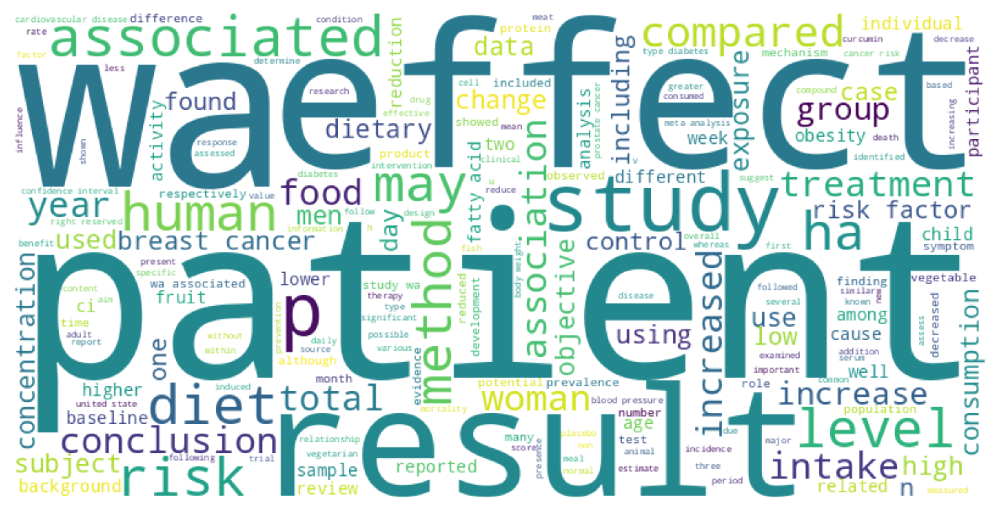

In [ ]:
show_wordcloud('lemmas')

Analyzing the distribution of the number of lemmas per document and comparing it with that of the tokens does not make particular sense as there would be no variations.

#### Stemming

In [ ]:
from nltk.stem.porter import PorterStemmer

porter_stemmer = PorterStemmer()

def stemming(text):
  return [porter_stemmer.stem(word) for word in text]

data_text['stems'] = data_text['tokens'].apply(stemming)
data_title['stems'] = data_title['tokens'].apply(stemming)
queries['stems'] = queries['tokens'].apply(stemming)

Examining the corpus through stems reveals that it consists of 30479 unique stems. This demonstrates a further reduction in the number of unique units compared to both the raw tokens and the lemmatized form, as stemming reduces words to their root forms (e.g., "associated" and "associating" become "associ"). The comparison between unique token and stems highlights, as is logical to expect, the enormous use of the same terms, but in different forms. The nature of the corpus, now characterized by even more generalized forms, still reflects specific themes, but with a higher level of abstraction. Stemming significantly reduces the lexical complexity, emphasizing the fundamental building blocks of words, which can be useful in computational analyses or when trying to reduce dimensionality. However, the reduction in form can lead to loss of nuance and make interpretation more challenging.

In [ ]:
number_info('stems')

Number of stems in document texts: 801377
Avarage stems for document texts: 220.58271401045968

Number of stems in document titles: 46396
Avarage stems for document titles: 12.770712909441233

Number of stems in queries: 1057
Avarage stems for queries: 3.2724458204334366

Number of total stems: 848830
Number of unique stems: 32202



The wordcloud generated after stemming presents an additional simplification of the lexicon. Once again, the main terms remain similar to those observed in the previous wordclouds: "patient", "effect", "result", "diet", and "level". However, the words are reduced to their roots, often truncated and less intuitive. For example, forms like "compar" (from "compare", "compared"), "increas" (from "increase", "increased"), and "reduc" (from "reduce", "reduced") are observed.

Stemming drastically reduces the complexity of the dataset, eliminating all grammatical and morphological variants of words. This method is particularly useful in statistical or computational analyses, where the main goal is to reduce the dimensionality of the data. However, readability suffers, and in some cases, the reduced form of words can be less intuitive for qualitative interpretations.

Once again, the distribution of terms appears more uniform compared to the wordcloud based on raw tokens. Stemming highlights the key concepts, reducing "linguistic noise" and making it easier to identify the roots of the most frequent words.

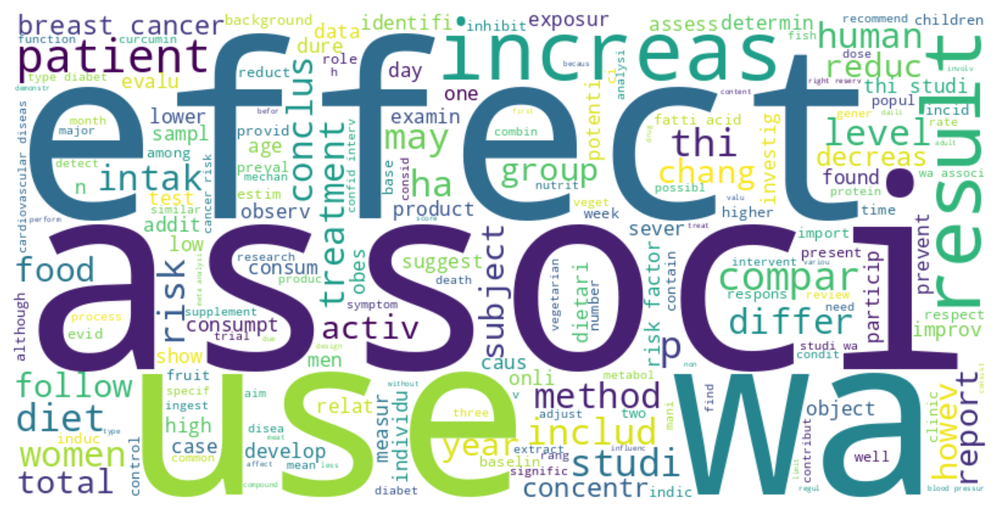

In [ ]:
show_wordcloud('stems')

Analyzing the distribution of the number of lemmas per document and comparing it with that of the tokens does not make particular sense as there would be no variations.

#### Considerations about unique tokens, lemmas and stems

The analysis of the distributions of tokens, lemmas, and stems suggests that the reduction in unique elements per document, from tokens to lemmas and from lemmas to stems, is moderate, but still significant.

In the case of **tokens**, the distribution is quite broad, with a mean of 125.31 and a maximum of 624. This implies that some documents have a large number of unique elements, but others have a relatively low number (minimum of 11). When moving to **lemmas**, the reduction becomes evident, with a mean of 122.1 and a maximum of 589. Although the distribution remains variable, the reduction from tokens to lemmas is not drastic, but still relevant, suggesting that reducing words to their base form results in a slight loss of unique elements.

The **reduction from lemmas to stems** is even more moderate. With a mean of 119.58 and a maximum of 553, the documents still show some variability, but with a slight decrease compared to lemmas. Therefore, the reduction from lemmas to stems is less pronounced but still noticeable. This suggests that the stemming process (which reduces words to a more simplified base form) leads to further compression of unique elements, but not in a drastic manner.

Overall, the reduction in unique elements from tokens to lemmas and stems is not particularly high, but it can be considered significant as it contributes to a compression of lexical variants, especially in documents with a large vocabulary. However, variability remains high across all three distributions, indicating that the linguistic structure of the documents is very diverse.

In [ ]:
data_text['unique tokens'] = data_text['tokens'].apply(lambda x: len(set(x)))
data_title['unique tokens'] = data_title['tokens'].apply(lambda x: len(set(x)))
queries['unique tokens'] = queries['tokens'].apply(lambda x: len(set(x)))

data_text['unique lemmas'] = data_text['lemmas'].apply(lambda x: len(set(x)))
data_title['unique lemmas'] = data_title['lemmas'].apply(lambda x: len(set(x)))
queries['unique lemmas'] = queries['lemmas'].apply(lambda x: len(set(x)))

data_text['unique stems'] = data_text['stems'].apply(lambda x: len(set(x)))
data_title['unique stems'] = data_title['stems'].apply(lambda x: len(set(x)))
queries['unique stems'] = queries['stems'].apply(lambda x: len(set(x)))

print('Document titles\n\n')

print('--- Tokens ---')
print()
show_statistic(data_text.copy().rename(columns={'doc_id': 'id', 'unique tokens': 'len'}))
print()
print('--- Lemmas ---')
print()
show_statistic(data_text.copy().rename(columns={'doc_id': 'id', 'unique lemmas': 'len'}))
print()
print('--- Stems ---')
print()
show_statistic(data_text.copy().rename(columns={'doc_id': 'id', 'unique stems': 'len'}))

Document titles


--- Tokens ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,125.993119,629,11,11.0,106.0,127.0,146.0,629.0,40.0,46.0,206.0,43.0,50.0,93.0
ID,NaN,MED-957,MED-1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Lemmas ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,122.779246,594,11,11.0,103.0,124.0,142.0,594.0,39.0,44.5,200.5,41.0,55.0,96.0
ID,NaN,MED-957,MED-1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Stems ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,120.276356,558,11,11.0,101.0,121.0,139.0,558.0,38.0,44.0,196.0,41.0,46.0,87.0
ID,NaN,MED-957,MED-1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Regarding document titles and queries, it can be noted that the reduction of tokens into lemmas and stems does not change the distribution of unique elements. This is almost exclusively due to the very low length of the strings.

In [ ]:
print('Document titles\n\n')

print('--- Tokens ---')
print()
show_statistic(data_title.copy().rename(columns={'doc_id': 'id', 'unique tokens': 'len'}))
print()
print('--- Lemmas ---')
print()
show_statistic(data_title.copy().rename(columns={'doc_id': 'id', 'unique lemmas': 'len'}))
print()
print('--- Stems ---')
print()
show_statistic(data_title.copy().rename(columns={'doc_id': 'id', 'unique stems': 'len'}))

print('\n\nQueries\n\n')

print('--- Tokens ---')
print()
show_statistic(queries.copy().rename(columns={'query_id': 'id', 'unique tokens': 'len'}))
print()
print('--- Lemmas ---')
print()
show_statistic(queries.copy().rename(columns={'query_id': 'id', 'unique lemmas': 'len'}))
print()
print('--- Stems ---')
print()
show_statistic(queries.copy().rename(columns={'query_id': 'id', 'unique stems': 'len'}))

Document titles


--- Tokens ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,12.122213,26,1,1.0,9.0,12.0,15.0,26.0,6.0,0.0,24.0,0.0,3.0,3.0
ID,NaN,MED-4080,MED-557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Lemmas ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,12.094688,26,1,1.0,9.0,12.0,15.0,26.0,6.0,0.0,24.0,0.0,3.0,3.0
ID,NaN,MED-4080,MED-557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Stems ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,12.098266,26,1,1.0,9.0,12.0,15.0,26.0,6.0,0.0,24.0,0.0,3.0,3.0
ID,NaN,MED-4080,MED-557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN




Queries


--- Tokens ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,3.23839,11,1,1.0,1.0,2.0,5.0,11.0,4.0,-5.0,11.0,0.0,0.0,0.0
ID,NaN,PLAIN-383,PLAIN-478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Lemmas ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,3.235294,11,1,1.0,1.0,2.0,5.0,11.0,4.0,-5.0,11.0,0.0,0.0,0.0
ID,NaN,PLAIN-383,PLAIN-478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Stems ---

Numerical Values 



,mean,max,min,Q0,Q1,Q2,Q3,Q4,IQR,lower_bound,upper_bound,n lower_outliers,n upper_outliers,total_outliers
Data,3.23839,11,1,1.0,1.0,2.0,5.0,11.0,4.0,-5.0,11.0,0.0,0.0,0.0
ID,NaN,PLAIN-383,PLAIN-478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Remove stop words

Removing stop words is a process that helps to simplify and optimize text by eliminating common and insignificant words (such as articles and conjunctions), in order to focus on words that add informational value. This process improves efficiency and accuracy in language analysis, reducing "noise" and enabling better performance in machine learning models and natural language processing (NLP) techniques. The removal of stop words offers several benefits, including:

- Reducing noise in the data: Stop words do not significantly contribute to the meaning of a text but still take up space. By removing them, the amount of data to be analyzed is reduced without losing useful information.
- Optimizing performance and improving accuracy in linguistic tasks: In the context of natural language processing (NLP) models or machine learning, eliminating stop words can make the model more efficient, as the number of words to analyze is reduced. This can lead to faster data processing and better performance, as the model focuses on more meaningful words.

In [ ]:
nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('english')

def remove_stopword(df):
    df['tokens without stopword'] = df['tokens'].copy()
    df['lemmas without stopword'] = df['lemmas'].copy()
    df['stems without stopword'] = df['stems'].copy()
    df['pos-tags without stopword'] = df['pos-tags'].copy()

    for index, row in df.iterrows():
        text = row['tokens without stopword']
        lemma = row['lemmas without stopword']
        stem = row['stems without stopword']
        pos = row['pos-tags without stopword']

        filtered_text = [word for word in text if word not in stop_words]
        filtered_lemma = [lemma[i] for i in range(len(text)) if text[i] not in stop_words]
        filtered_stem = [stem[i] for i in range(len(text)) if text[i] not in stop_words]
        filtered_pos = [pos[i] for i in range(len(text)) if text[i] not in stop_words]

        df.at[index, 'tokens without stopword'] = filtered_text
        df.at[index, 'lemmas without stopword'] = filtered_lemma
        df.at[index, 'stems without stopword'] = filtered_stem
        df.at[index, 'pos-tags without stopword'] = filtered_pos

    return df

data_text = remove_stopword(data_text)
data_title = remove_stopword(data_title)
queries = remove_stopword(queries)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


The removal of stopwords had a significant impact on the structure of textual data, highlighting changes in both the overall quantity of terms and their distribution and variety. This process allowed for a substantial reduction in the total volume of data while maintaining a good representation of the informational content.

Regarding the document texts, the total number of tokens decreased from 796,754 to 524,122, representing a reduction of approximately 34.23%. Similarly, the average number of tokens per document was proportionally reduced, dropping from 219.31 to 144.27. This indicates that stopwords constituted a significant portion of the overall text without directly contributing to its main meaning. A similar pattern was observed in document titles: the total number of tokens decreased by 29.41%, going from 46,534 to 32,847, with a reduction in the average number of tokens from 12.81 to 9.04. This demonstrates that, although titles are shorter and more compact, they still contained a substantial share of stopwords. Finally, even in queries, which are characterized by a smaller number of terms, a 22.30% reduction in tokens was observed, with the average dropping from 3.28 to 2.55. While less drastic, this reduction is significant for improving the efficiency of query processing.

Another interesting aspect concerns the behavior of unique tokens. Before removal, the total number of unique tokens was 37,971, while after removal, it slightly decreased to 37,844, registering a minimal reduction of 0.33%. This indicates that stopwords formed a small and highly repetitive set, composed of a few words that occurred frequently in the textual data. The near invariance in the number of unique tokens suggests that removing stopwords did not significantly alter the overall lexical variety, focusing instead on eliminating redundant terms. Similar effects are observed when analyzing lemmas and stems.

A crucial aspect to emphasize is the increase in semantic density achieved by removing stopwords. In the document texts, each word remaining after the removal process carries greater weight in representing the overall meaning of the text.

In [ ]:
print('-- Tokens --')
print()
number_info('tokens without stopword')
print()
print('-- Lemmas --')
print()
number_info('lemmas without stopword')
print()
print('-- Stems --')
print()
number_info('stems without stopword')

-- Tokens --

Number of tokens without stopword in document texts: 528921
Avarage tokens without stopword for document texts: 145.58794384805947

Number of tokens without stopword in document titles: 32734
Avarage tokens without stopword for document titles: 9.010184420589045

Number of tokens without stopword in queries: 822
Avarage tokens without stopword for queries: 2.544891640866873

Number of total tokens without stopword: 562477
Number of unique tokens without stopword: 39508


-- Lemmas --

Number of lemmas without stopword in document texts: 528921
Avarage lemmas without stopword for document texts: 145.58794384805947

Number of lemmas without stopword in document titles: 32734
Avarage lemmas without stopword for document titles: 9.010184420589045

Number of lemmas without stopword in queries: 822
Avarage lemmas without stopword for queries: 2.544891640866873

Number of total lemmas without stopword: 562477
Number of unique lemmas without stopword: 37153


-- Stems --

Number 

The removal of stopwords in the word clouds shown in the images has a noticeable effect on the representation and interpretation of the content. Stopwords, which include common words such as "has," "was," "may," "that," "with," and similar terms, are prominently visible in the initial word clouds (e.g., "tokens" and "lemmas"). These words do not contribute any significant conceptual meaning to the text but tend to take up visual space, reducing the effectiveness of the representation. Their removal makes the word cloud clearer and more focused on the core concepts.

Let us take the "tokens" word cloud as an example, where both key terms such as "patient," "effect," and "result" appear, alongside less meaningful words like "may" or "has." After removing the stopwords, as seen in the "tokens without stopwords" word cloud, the result becomes much more focused. Here, irrelevant terms have disappeared, while essential concepts such as "patient," "effect," "level," "result," "diet," and "intake" emerge more clearly and prominently. This allows for a better understanding of the main themes addressed in the corpus, such as diet, health, or the effects of a treatment.

The same effect is evident in the cases of **lemmas** and **stems**. In these word clouds as well, once stopwords are removed, the word clouds become clearer, and key terms—such as "effect," "patient," "result," "level," and "diet"—take center stage. In addition to these terms, others, such as "use," "reduc," and "compar," stand out more prominently compared to the analysis performed on tokens. This is because reducing words to their roots helps aggregate the frequencies of numerous variants. By analyzing 'lemmas without stopwords' and 'stems without stopwords,' it is therefore possible to conduct a more accurate analysis of the context of the textual data.

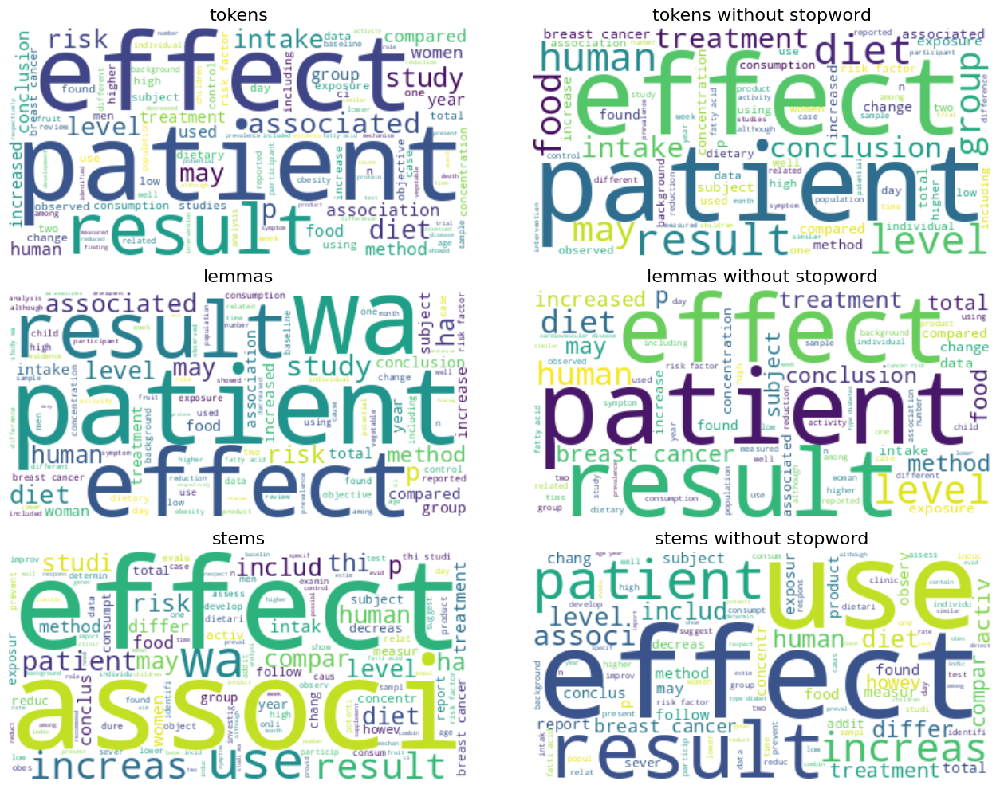

In [ ]:
texts = [
    full_dict['tokens'],
    full_dict['tokens without stopword'],
    full_dict['lemmas'],
    full_dict['lemmas without stopword'],
    full_dict['stems'],
    full_dict['stems without stopword']
]

titles = [
    "tokens",
    "tokens without stopword",
    "lemmas",
    "lemmas without stopword",
    "stems",
    "stems without stopword"
]

fig, axes = plt.subplots(3, 2, figsize=(20, 10))

for i, ax in enumerate(axes.flat):
    wordcloud = WordCloud(background_color="white").generate(" ".join(texts[i]))
    ax.imshow(wordcloud, interpolation="bilinear")
    ax.set_title(titles[i], fontsize=16)
    ax.axis("off")

plt.tight_layout()
plt.subplots_adjust(wspace=-0.5)
plt.show()

## PART II: Basic Retrieval Pipelines

To ensure clarity and alignment with the standards, a "clean-up" process is carried out to retain only the essential information needed for indexing the collections. Specifically:

- Documents:  
  - the IDs are preserved, renamed to `docno`.  
  - Normalized titles are retained, with the column renamed from `normalized` to `title`.  
  - Texts, in their normalized variant, are kept, with the column renamed from `normalized` to `text`.  

- Queries:  
  - the IDs are preserved, renamed to `qid`.  
  - the normalized query text is retained, with the column renamed from `normalized` to `query`.  

- Truth Ground: column names are updated to comply with PyTerrier standards.  
  - `query_id` is renamed to `qid`.  
  - `doc_id` is renamed to `docno`.  
  - `relevance` is renamed to `label`.

The decision to preserve the normalized texts instead of the original ones was primarily made because it was observed that the use of original texts often led to Runtime errors during processing. By relying on the normalized versions, these issues can be avoided, ensuring smoother and more reliable execution.

In [ ]:
text = data_text[['doc_id', 'normalized']].copy()
text.rename(columns={'doc_id': 'docno', 'normalized': 'text'}, inplace=True)
text['title'] = data_title['normalized']

query = queries[['query_id', 'normalized']].copy()
query.rename(columns={'normalized': 'query', "query_id": "qid"}, inplace=True)

qrels_df.rename(columns={"query_id": "qid", "doc_id": "docno", "relevance": "label"}, inplace=True)

Then, it is necessary to define some functions. The first function, `get_index`, is designed to create or load an index for a document corpus. It starts by handling the index path: the name of a directory where information will be saved or retrieved is reconstructed.

Once the path is determined, the function checks if a folder containing the index already exists. If the folder does not contain the `data.properties` file, it means the index has not been created yet. In this case, the function sets specific properties for the index, such as the use of *stopwords* and the *stemmer*, along with some configurations for the metadata. Then, it creates an `IterDictIndexer` object to perform the indexing, converting the corpus into a dictionary format and raising an error if the corpus is empty or invalid. The index is then created from the corpus.

If the `data.properties` file already exists, the function loads a reference to the existing index using `pt.IndexRef.of()`. Finally, the function returns the index, whether it was just created or loaded, using `pt.IndexFactory.of()`.

In [ ]:
os.makedirs('./Index', exist_ok=True)

def get_index(index_path, stemmer, corpus, field='text', meta='title'):
    if "./Index/" not in index_path:
        index_path = './Index/' + index_path

    index_path = index_path + "_" + stemmer + "_" + field

    os.makedirs(index_path, exist_ok=True)

    if not os.path.exists(index_path + "/data.properties"):
        pt.terrier.set_property("termpipelines", "Stopwords," + stemmer)
        pt.terrier.set_property("indexer.meta.forward.keylens", "20,10000")
        pt.terrier.set_property("indexer.meta.reverse.keys", "docno," + meta)

        indexer = pt.index.IterDictIndexer(index_path,
                                           overwrite=True,
                                           text_attrs=[field],
                                           meta={'docno': 20, meta: 10000},
                                           meta_reverse=['docno', meta])

        corpus_dict = corpus.to_dict(orient='records')
        if not corpus_dict:
            raise ValueError("Empty or not valid corpus.")

        index_ref = indexer.index(corpus_dict)
    else:
        index_ref = pt.IndexRef.of(index_path + "/data.properties")

    return pt.IndexFactory.of(index_ref)


Another function is `evaluation`, which takes two arguments as input: `models` and `names`. Inside, the function uses the PyTerrier library to perform an evaluation on `models`. Within the function, an `Experiment` object is created that evaluates the models on the query and qrels data, using a set of evaluation metrics. The metrics include:

- MAP (Mean Average Precision): measures the average precision of a system by calculating the precision for each query where the system returns relevant documents, and then averaging over all queries. It is a useful measure to evaluate how well a system retrieves relevant documents.

- nDCG (Normalized Discounted Cumulative Gain): takes into account the relevance of the retrieved documents and their position in the results. The higher a relevant document is in the list, the better the nDCG score. The "normalized" version allows for comparing results across different query sets.

- nDCG@k: a variant of nDCG that considers only the top *k* documents. Specific versions such as "nDCG_cut.1", "nDCG_cut.2", etc., calculate nDCG considering only the top 1, 2, 4, 6, 8, or 10 results, allowing for an assessment of performance at different list lengths.

- Precision@k: measures the fraction of relevant documents within the top *k* results returned by the system. Versions like "P.1", "P.2", etc., represent precision considering only the top 1, 2, 4, 6, 8, or 10 results.

- Recall@k: indicates the fraction of relevant documents that have been retrieved among the top *k* results. Again, versions like "recall.1", "recall.2", etc., show recall for different list lengths of results.

Finally, the `Experiment` object returns the results of the calculated evaluation metrics, which are then returned by the function.

In [ ]:
from pyterrier.measures import *

eval_metrics=[
    "map",  # Mean Average Precision
    "ndcg",  # Normalized Discounted Cumulative Gain
    "ndcg_cut.1", "ndcg_cut.2", "ndcg_cut.4", "ndcg_cut.6", "ndcg_cut.8", "ndcg_cut.10",  # nDCG@k
    "P.1", "P.2", "P.4", "P.6", "P.8", "P.10",  # Precision@k
    "recall.1", "recall.2", "recall.4", "recall.6", "recall.8", "recall.10"  # Recall@k
]

view_table=[
    'name',
    'map',
    'ndcg',
    'ndcg_cut.1', 'ndcg_cut.10',
    'P.1', 'P.10',
    'recall.1', 'recall.10'
]

def evaluation(models, names):
  metrics = pt.Experiment(
      models,
      query,
      qrels_df,
      names=names,
      eval_metrics=eval_metrics
  )

  return metrics

The third and final function defined is query_analysis, which takes as input the results of a search and evaluates them with respect to the "P10" parameter. The function extracts the IDs of the 2 queries with the worst performance, those with the best performance, and those with performance close to the median of the P.10 distribution, allowing a comparative analysis of the queries.

Once the list of IDs for each query has been obtained:
- All the (query, document) pairs present in the qrels dataset are identified.
- For each (query, document) pair, a table is created containing the following information:
  - Query ID: the unique identifier of the analyzed query.
  - Document ID: the unique identifier of the document associated with the query.
  - P10 value for the query
  - Rank of the (query, document) pair: the position of the (query, document) pair in the ranking. If the pair does not appear in the results, a value of -1 is assigned.
  - Query text: the full text of the query, useful for contextualizing the searched keywords.
  - Percentage of query words present in the document title: the percentage of query words that appear in the document title, an indicator of semantic relevance.
  - Percentage of query words present in the document text: similar to the previous, but with the document text.
  - Percentage of the query stems present in the stems of the document title: measures how much the query stems are present in the document title, useful for evaluating semantic similarity at the linguistic level.
  - Percentage of the query stems present in the stems of the document text: similar to the previous, but with the document text.
  - List of query words present in the document title: a list of the individual query words that appear in the document title, to analyze lexical matching.
  - List of query words present in the document text: similar to the previous.
  - List of query stems present in the stems of the document title: a list of the stems of the query words that appear in the document title, useful for evaluating linguistic similarity.
  - List of query stems present in the stems of the document text: similar to the previous.

The results are stored in a dataframe.

Subsequently, two dataframes are displayed:
- The number of documents associated with the query in the qrels dataset, to provide an overview of the distribution of results.
- The previously described table, but for queries with a "P10" value greater than 0, the "best" results are mainly highlighted, i.e., those that appear in the ranking (rank ≠ -1). This allows for observing how the approach changes as P.10 increases. For each query, a maximum of 5 examples are selected for more focused analysis.

In [ ]:
def check_presence(text1, text2):
  i = 0
  sub = []

  for word in text1:
    if word in text2:
      i += 1
      sub.append(word)

  i = (i/len(text1)) * 100

  return i, sub

def query_analysis(results):
  eval = pt.Evaluate(results, qrels_df, metrics=["P.10"], perquery=True)

  eval_sorted = pd.DataFrame(eval).T.sort_values(by="P.10", ascending=True)

  top_two = eval_sorted.head(2)

  bottom_two = eval_sorted.tail(2)

  if len(eval_sorted) > 10:
    middle_indices = len(eval_sorted) // 2
    middle_two = eval_sorted.iloc[[middle_indices - 1, middle_indices]]
    result = pd.concat([top_two, middle_two, bottom_two])
  else:
    result = pd.concat([top_two, bottom_two])

  query_id = []
  query_text = []
  p10 = []
  rank = []
  doc_id = []
  percentage_title = []
  words_title = []
  words_text = []
  percentage_text = []
  percentage_title_stem = []
  words_title_stem = []
  percentage_text_stem = []
  words_text_stem = []

  for analysis in list(result.index):
    analysis_query = query[query['qid'] == analysis]['query'].values[0]

    for docid in qrels_df[qrels_df['qid'] == analysis]['docno'].values:

      query_id.append(analysis)
      query_text.append(analysis_query)
      p10.append(result.loc[analysis]['P.10'])

      doc_id.append(docid)

      rank_df = results[(results['qid'] == analysis) & (results['docno'] == docid)]['rank'].index
      if rank_df.empty:
        rank.append(-1)
      else:
        rank.append(results['rank'][rank_df[0]])

      query_split = analysis_query.split()
      query_stem = [porter_stemmer.stem(word) for word in query_split]

      analysis_title = text[text['docno'] == docid]['title'].values[0]
      title_stem = [porter_stemmer.stem(word) for word in analysis_title.split()]

      analysis_text = text[text['docno'] == docid]['text'].values[0]
      text_stem = [porter_stemmer.stem(word) for word in analysis_text.split()]

      n1, n2 = check_presence(query_split, analysis_title)
      percentage_title.append(n1)
      words_title.append(n2)

      n1, n2 = check_presence(query_stem, " ".join(title_stem))
      percentage_title_stem.append(n1)
      words_title_stem.append(n2)

      n1, n2 = check_presence(query_split, analysis_text)
      percentage_text.append(n1)
      words_text.append(n2)

      n1, n2 = check_presence(query_stem, " ".join(text_stem))
      percentage_text_stem.append(n1)
      words_text_stem.append(n2)


  stat_info = {
    "Query ID": query_id,
    "Doc ID": doc_id,
    "P10": p10,
    "Rank": rank,

    "Query Text": query_text,

    "% query words in title": percentage_title,
    "% query words in text": percentage_text,

    "% query stem in title": percentage_title_stem,
    "% query stem in text": percentage_text_stem,

    "Query words in title": words_title,
    "Query words in text": words_text,
    "Query stems in title": words_title_stem,
    "Query stems in text": words_text_stem
  }

  df = pd.DataFrame(stat_info)

  p10_zero = df[df['P10'] == 0]

  p10_nonzero_rank_valid = df[(df['P10'] != 0) & (df['Rank'] != -1)]

  sampled_df = pd.concat([p10_zero, p10_nonzero_rank_valid])

  sampled_df = sampled_df.groupby('Query ID', group_keys=False).apply(lambda x: x.sample(min(len(x), 5)))
  display(sampled_df.sort_values(by=["P10", 'Query ID'], ascending=[True, True]).round(3))

  print('\nNumber of relevant documents for query in qrels')

  display(df['Query ID'].value_counts())

### Comparing Stemmers

After defining the main functions, the first step is to analyze the impact of different stemmers on the document indexing process. This is a crucial aspect since the preprocessing pipeline—which, in our case, includes tokenization, stopword removal, and stemmer application—can produce different results depending on the algorithms used at each step.  

Specifically, the following stemmers were analyzed:  
- `EnglishStemmer`: a simple stemmer focused primarily on the English language, performing a basic reduction of words to their roots. It is fast and effective for basic operations.  
- `LancasterStemmer`: a very aggressive stemmer that reduces words to their base form, sometimes excessively. It can be useful in contexts where extreme simplification is prioritized but may lead to significant information loss.  
- `KrovetzStemmer`: a less aggressive stemmer compared to Lancaster, which uses an internal dictionary to ensure that the produced stem is a valid word. This approach makes it more accurate in many cases.  
- `PorterStemmer`: one of the most popular and widely used stemmers, designed to reduce English words to their morphological root through a set of well-defined rules. It is balanced and versatile for various applications.  

From the analysis of the executed code, it can be observed that all the stemmers produce the same list of stems in this specific context. This suggests that, for the dataset or domain considered, the differences between the algorithms did not significantly impact the final result. However, it is important to note that in other contexts or with different datasets, the results may vary significantly depending on the chosen stemmer.  

In [ ]:
tokens_index = {}
n_tokens = []
n_lexicon_key = []

stemmers = ["EnglishStemmer", "LancasterStemmer", "KrovetzStemmer", "PorterStemmer"]
for stemmer in stemmers:
  index = get_index("only_text", stemmer, text)
  tokens_index[stemmer] = sorted([kv.getKey() for kv in index.getLexicon()])
  n_tokens.append(index.getCollectionStatistics().getNumberOfTokens())
  n_lexicon_key.append(len(set(tokens_index[stemmer])))

equal = True
for stemmer in stemmers:
  if tokens_index["EnglishStemmer"] != tokens_index[stemmer]:
    equal = False
    break

tokens_index = {
    'Stemmer': stemmers,
    'Number of tokens/stems': n_tokens,
    'Number of unique stems': n_lexicon_key
}

display(pd.DataFrame(tokens_index))

print()
if equal:
  print("All stemmers have the same tokens")
else:
  print("Not all stemmers have the same tokens")

,Stemmer,Number of tokens/stems,Number of unique stems
0,EnglishStemmer,515960,19466
1,LancasterStemmer,515960,19466
2,KrovetzStemmer,515960,19466
3,PorterStemmer,515960,19466



All stemmers have the same tokens


### Pipelines

During the analysis, two types of indexing will be used and thoroughly examined:  

- `indexDoc` indexing, which primarily relies on the textual content of documents, using the text as the main field for indexing.  
- `indexTitle` indexing, which focuses the indexing process on the titles of documents, using them as the primary field.  

The two indexing methods are kept separate to ensure simpler, more modular, and flexible management, allowing analyses and tests to be adapted more efficiently to specific scenarios. Furthermore, in both indexing processes, it was decided to store in the metadata the data of the documents that are not directly utilized. This choice allows the preservation of additional information that could be "added" in subsequent stages of analysis or in specific usage contexts, without overburdening the primary fields dedicated to indexing.  

In [ ]:
indexDoc = get_index("only_text", "PorterStemmer", text)
indexTitle = get_index("only_title", "PorterStemmer", text, field='title', meta='text')

#### Pipeline 1

In the first proposal, a retriever is used, which is an object responsible for retrieving documents from the specified index. It uses the `indexDoc` index and the specified weighting model "TF_IDF" (Term Frequency-Inverse Document Frequency), one of the classic models for calculating the relevance of documents with respect to a query. TF-IDF is a technique for evaluating the importance of a word in a document by using two parameters:
- TF (Term Frequency): measures the frequency of a word in a document. The more a word appears in a document, the higher its TF score.
- IDF (Inverse Document Frequency): measures the importance of the word across the entire corpus. The more a word appears in many documents, the lower its IDF score.

In [ ]:
br1 = pt.terrier.Retriever(indexDoc, wmodel="TF_IDF")
p1 = br1.transform(query)
p1.round(3)

,qid,docid,docno,rank,score,query
0,PLAIN-2,0,MED-10,0,16.019,do cholesterol statin drugs cause breast cancer
1,PLAIN-2,1,MED-14,1,16.002,do cholesterol statin drugs cause breast cancer
2,PLAIN-2,1373,MED-2429,2,13.466,do cholesterol statin drugs cause breast cancer
3,PLAIN-2,346,MED-1193,3,12.782,do cholesterol statin drugs cause breast cancer
4,PLAIN-2,1375,MED-2431,4,12.606,do cholesterol statin drugs cause breast cancer
...,...,...,...,...,...,...
116971,PLAIN-3472,1469,MED-2587,605,1.505,how doctors responded to being named a leading...
116972,PLAIN-3472,2055,MED-3527,606,1.445,how doctors responded to being named a leading...
116973,PLAIN-3472,998,MED-1987,607,1.409,how doctors responded to being named a leading...
116974,PLAIN-3472,1276,MED-2304,608,1.065,how doctors responded to being named a leading...


#### Pipeline 2

The second proposal is the same as the first, but uses a different weighting model, BM25, for document retrieval. BM25 is based on the frequency of terms (similar to TF) but also introduces normalization and saturation parameters, which limit the effect of very frequent or too rare words.

In [ ]:
br2 = pt.terrier.Retriever(indexDoc, wmodel='BM25')
p2 = br2.transform(query)
p2.round(3)

,qid,docid,docno,rank,score,query
0,PLAIN-2,0,MED-10,0,27.476,do cholesterol statin drugs cause breast cancer
1,PLAIN-2,1,MED-14,1,26.863,do cholesterol statin drugs cause breast cancer
2,PLAIN-2,1373,MED-2429,2,23.009,do cholesterol statin drugs cause breast cancer
3,PLAIN-2,346,MED-1193,3,21.890,do cholesterol statin drugs cause breast cancer
4,PLAIN-2,1375,MED-2431,4,21.741,do cholesterol statin drugs cause breast cancer
...,...,...,...,...,...,...
116971,PLAIN-3472,1469,MED-2587,605,2.607,how doctors responded to being named a leading...
116972,PLAIN-3472,2055,MED-3527,606,2.539,how doctors responded to being named a leading...
116973,PLAIN-3472,998,MED-1987,607,2.476,how doctors responded to being named a leading...
116974,PLAIN-3472,1276,MED-2304,608,1.871,how doctors responded to being named a leading...


#### Pipeline 3

The third proposal is composed in an identical manner to the first, with the difference that the indexation that occurred on the securities is exploited.

In [ ]:
br3 = pt.terrier.Retriever(indexTitle, wmodel="TF_IDF")
p3 = br3.transform(query)
p3.round(3)

,qid,docid,docno,rank,score,query
0,PLAIN-2,0,MED-10,0,9.520,do cholesterol statin drugs cause breast cancer
1,PLAIN-2,1373,MED-2429,1,9.520,do cholesterol statin drugs cause breast cancer
2,PLAIN-2,1,MED-14,2,9.095,do cholesterol statin drugs cause breast cancer
3,PLAIN-2,1375,MED-2431,3,7.717,do cholesterol statin drugs cause breast cancer
4,PLAIN-2,2728,MED-4391,4,6.140,do cholesterol statin drugs cause breast cancer
...,...,...,...,...,...,...
36429,PLAIN-3472,1053,MED-2049,24,3.419,how doctors responded to being named a leading...
36430,PLAIN-3472,356,MED-1204,25,3.242,how doctors responded to being named a leading...
36431,PLAIN-3472,2024,MED-3495,26,3.242,how doctors responded to being named a leading...
36432,PLAIN-3472,671,MED-1575,27,3.132,how doctors responded to being named a leading...


#### Pipeline 4

The fourth proposal is composed in the same way as the second, with the difference that the indexation that occurred on the securities is exploited.

In [ ]:
br4 = pt.terrier.Retriever(indexTitle, wmodel='BM25')
p4 = br4.transform(query)
p4.round(3)

,qid,docid,docno,rank,score,query
0,PLAIN-2,0,MED-10,0,16.891,do cholesterol statin drugs cause breast cancer
1,PLAIN-2,1373,MED-2429,1,16.891,do cholesterol statin drugs cause breast cancer
2,PLAIN-2,1,MED-14,2,16.137,do cholesterol statin drugs cause breast cancer
3,PLAIN-2,1375,MED-2431,3,13.692,do cholesterol statin drugs cause breast cancer
4,PLAIN-2,2728,MED-4391,4,10.774,do cholesterol statin drugs cause breast cancer
...,...,...,...,...,...,...
36429,PLAIN-3472,1053,MED-2049,24,6.176,how doctors responded to being named a leading...
36430,PLAIN-3472,356,MED-1204,25,5.904,how doctors responded to being named a leading...
36431,PLAIN-3472,2024,MED-3495,26,5.904,how doctors responded to being named a leading...
36432,PLAIN-3472,671,MED-1575,27,5.703,how doctors responded to being named a leading...


#### Pipeline 5

The latest proposals experimented with focus on the combination of previously developed models that have the same weighting. Specifically, in this case, the integration of two models using the TF-IDF weighting method has been explored. When combining two retrievers, the results generated by both models are merged into a single list of results. This merging process does not involve any substantial modification of the individual scores of the results obtained from each model; rather, the results are unified in such a way that they form a comprehensive list, including all the entries from the two retrievers, thereby expanding the range of possible responses.

In [ ]:
br5 = br1 + br3
p5 = br5.transform(query)
p5.round(3)

,qid,docid,docno,score,query,rank
0,PLAIN-1008,2955.0,MED-4668,7.245,deafness,0
1,PLAIN-1018,607.0,MED-1503,5.036,dha,20
2,PLAIN-1018,870.0,MED-1801,6.047,dha,16
3,PLAIN-1018,893.0,MED-1832,7.319,dha,5
4,PLAIN-1018,1358.0,MED-2411,6.475,dha,15
...,...,...,...,...,...,...
124319,PLAIN-977,185.0,MED-982,2.531,crib death,120
124320,PLAIN-977,193.0,MED-991,1.783,crib death,263
124321,PLAIN-987,429.0,MED-1293,5.588,cumin,1
124322,PLAIN-987,1599.0,MED-2780,6.550,cumin,0


#### Pipeline 6

The last proposal however is the same as the previous one, but with BM25

In [ ]:
br6 = br2 + br4
p6 = br6.transform(query)
p6.round(3)

,qid,docid,docno,score,query,rank
0,PLAIN-1008,2955.0,MED-4668,12.624,deafness,0
1,PLAIN-1018,607.0,MED-1503,9.171,dha,20
2,PLAIN-1018,870.0,MED-1801,11.012,dha,16
3,PLAIN-1018,893.0,MED-1832,13.329,dha,5
4,PLAIN-1018,1358.0,MED-2411,11.791,dha,15
...,...,...,...,...,...,...
125117,PLAIN-977,185.0,MED-982,4.370,crib death,120
125118,PLAIN-977,193.0,MED-991,3.079,crib death,263
125119,PLAIN-987,429.0,MED-1293,10.019,cumin,1
125120,PLAIN-987,1599.0,MED-2780,11.745,cumin,0


### Considerations and Global Evaluations

We now proceed with the evaluation. The table analyzes the performance of the proposed pipelines and models. The evaluations are conducted using standard metrics such as MAP, NDCG, and precision (P.1 and P.10). Each metric provides a complementary perspective on the effectiveness of the model.

Regarding MAP (Mean Average Precision), which measures the overall average precision while considering the ranking of relevant documents, we observe that the BM25 and TF-IDF models exhibit similar behavior. For example, with the "text only" input, BM25 records a MAP of 0.146 compared to 0.145 for TF-IDF. A minimal difference is also noticeable for the "title and text" input, with BM25 achieving a slightly higher MAP (0.149 versus 0.148 for TF-IDF). However, for the "title only" input, both models achieve an identical value of 0.101, indicating that the title alone is insufficient to generate significant improvements in ranking.

The NDCG (Normalized Discounted Cumulative Gain) and its cutoff versions (ndcg_cut.1 and ndcg_cut.10), which measure ranking quality while penalizing relevant documents positioned lower, show a similar trend. For the "title and text" input, BM25 achieves an NDCG of 0.298 compared to 0.298 for TF-IDF, while for ndcg_cut.10, the values increase to 0.423 and 0.420, respectively, confirming the ability of both models to maintain good ranking performance overall. Here too, BM25 shows a slight advantage, albeit minimal.

Turning to precision, the metrics P.1 and P.10 measure the proportion of relevant documents in the top 1 and top 10 retrieved documents. These indicators are particularly important in practical contexts where users focus on the top results. For the "text only" input, both models achieve a P.10 of 0.430, indicating identical precision. However, in the case of "title and text", BM25 stands out with a maximum value of 0.443, compared to 0.440 for TF-IDF. This makes BM25 the preferred model for applications where precision in the top results is critical.

Finally, recall metrics (recall.1 and recall.10), which measure the proportion of relevant documents retrieved out of the total available relevant documents, show almost identical performance between the two models. For instance, the recall.10 value for the "title and text" input is 0.150 for both BM25 and TF-IDF. These numbers suggest that both models can capture the same number of relevant documents in the top 10 positions, but the difference lies in their ability to rank them correctly (as reflected in other metrics).

Overall, the BM25 "title and text" model emerges as the best performer. Its maximum P.10 of 0.443 is particularly significant, as this metric represents precision for the top 10 retrieved documents, which are the most important for the user. In practical contexts, such as search engines or recommendation systems, the primary goal is to quickly satisfy the user with relevant documents in the top positions. For this reason, the maximum P.10 achieved by BM25 with "title and text" is a key indicator of its superiority for user-centric applications.

In [ ]:
metrics = evaluation([br1, br2, br3, br4, br5, br6], ['TF_IDF - only text', 'BM25 - only text', 'TF_IDF - only title', 'BM25 - only title', 'TF_IDF - title and text', 'BM25 - title and text'])
display(metrics[view_table].round(3))

,name,map,ndcg,ndcg_cut.1,ndcg_cut.10,P.1,P.10,recall.1,recall.10
0,TF_IDF - only text,0.145,0.293,0.413,0.314,0.430,0.228,0.057,0.146
1,BM25 - only text,0.146,0.293,0.413,0.313,0.430,0.227,0.057,0.145
2,TF_IDF - only title,0.101,0.205,0.353,0.243,0.368,0.169,0.051,0.111
3,BM25 - only title,0.101,0.205,0.351,0.244,0.368,0.170,0.051,0.111
4,TF_IDF - title and text,0.148,0.298,0.420,0.318,0.440,0.230,0.056,0.150
5,BM25 - title and text,0.149,0.298,0.423,0.318,0.443,0.231,0.056,0.150


Through the analysis of the graphs on the performance of Precision, NDCG and Recall, further confirmations can be obtained. The graphs use k values ​​not shown in the table.

The first chart represents the trend of Precision@k. Precision@k measures the proportion (percentage) of relevant documents among the top k retrieved results. It reflects how many of the top k results are actually relevant to the user's query.

The first noticeable factor is that precision progressively decreases as $k$ increases, as expected in an information retrieval context. As more documents are included in the results, it is natural for the proportion of relevant documents to decrease. Precision drops rapidly for the initial values of $k$, showing that the models are highly accurate in retrieving the most relevant documents at the beginning. However, the trend becomes more stable for higher values of $k$, as the quality of the results tends to level off.

Additionally, it can be observed that BM25 generally outperforms, albeit slightly, TF-IDF, particularly for the text only and combined title and text input configurations. This behavior aligns with the fact that BM25 is a more sophisticated model, designed to better handle document length and term ranking. One of the main reasons BM25 slightly outperforms TF-IDF is related to the distribution of title and text lengths shown earlier: the distributions are only slightly imbalanced (especially in the case of titles), making the normalization effect of BM25 less impactful.

In fact, when comparing input configurations, it is evident that:
   - Combined title and text offers the best performance for both models. Adding context from both the title and the body of the text allows for more accurate document retrieval.
   - Title only is the least effective configuration, with significantly lower precision compared to the others. This highlights that the title, while useful, is insufficient to determine relevance with high precision.
   - Text only falls between the two configurations, demonstrating that the full text is generally informative, but titles add a significant contribution to the final ranking.

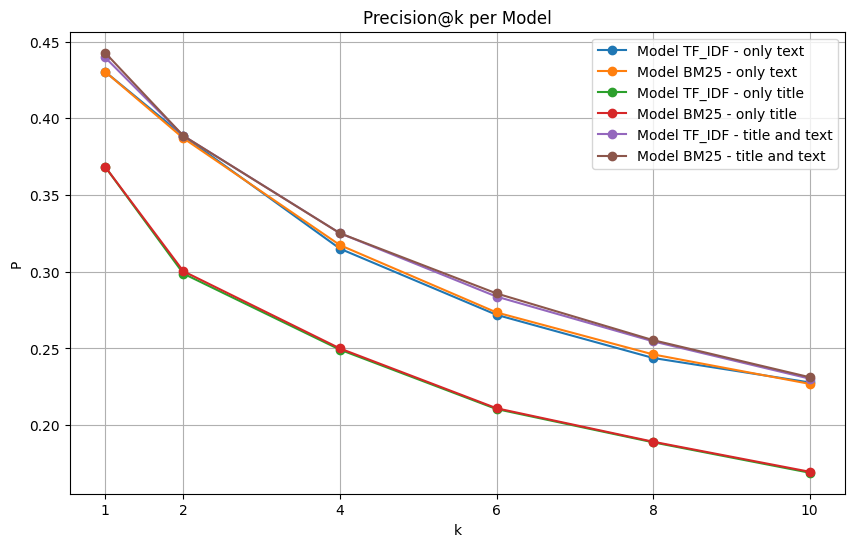

In [ ]:
k_values = [1, 2, 4, 6, 8, 10]
def plot_metrics(metric_prefix, title, results_df):
    plt.figure(figsize=(10, 6))
    for model_id, model_name in enumerate(results_df['name']):
        values = [results_df[f"{metric_prefix}.{k}"][model_id] for k in k_values]
        plt.plot(k_values, values, marker='o', label=f'Model {model_name}')

    plt.title(title)
    plt.xlabel("k")
    plt.ylabel(metric_prefix)
    plt.xticks(k_values)
    plt.legend()
    plt.grid(True)
    plt.show()


plot_metrics("P", "Precision@k per Model", metrics)

The graph shows a comparison between models in terms of Recall@k. Recall@k measures the percentage of relevant documents retrieved within the top k results. A higher recall value indicates that more relevant documents are found.

In general, BM25 outperforms TF-IDF here as well, achieving higher recall values in almost all input combinations. This suggests that BM25 is more effective at retrieving relevant documents. The best results are achieved when both the title and the text are used, confirming that combining richer information improves performance compared to using either the title or the text in isolation.

On the other hand, using only the title leads to the worst performance, particularly for TF-IDF, which significantly lags behind the other configurations. This is expected, as the title alone contains less information than the full document text.

An interesting point is that recall consistently increases for both models as k increases, as predicted by the definition of Recall@k, which implies that a larger number of relevant documents are retrieved as the number of considered results grows. Despite BM25 showing superior performance compared to TF-IDF, the maximum Recall@k value remains relatively low. This could be due to the fact that the ground truth has an imbalanced distribution. If only a small portion of the documents are relevant and they are sparsely distributed across the corpus, it becomes harder for the model to locate them accurately. Models rely on keywords and frequencies, and if the terms that characterize relevant documents are not frequent or well-distributed in the text, relevant documents may end up in lower positions in the search results, thus lowering recall.

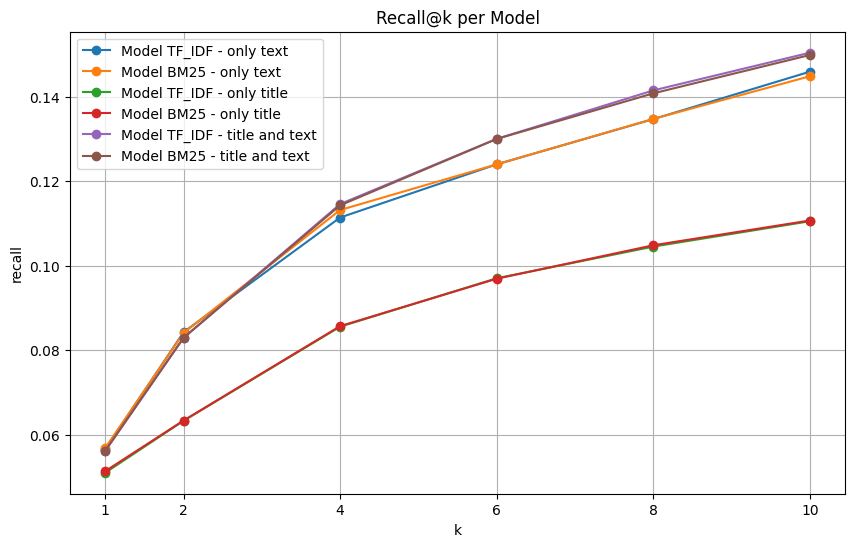

In [ ]:
plot_metrics("recall", "Recall@k per Model", metrics)

The third and final graph represents the trend of NDCG@k. It can be observed that for all models, NDCG@k decreases as the value of k increases. This behavior is expected since it becomes more challenging to maintain high relevance in the results as the set of considered responses expands.

The best results are again obtained by combining title and text, both with TF-IDF and BM25, especially for lower $k$ values such as 1 or 2, where ranking quality is crucial. Between the two models, BM25 once again demonstrates superior performance compared to TF-IDF in almost all configurations.

The performance shown in the graph can be considered moderate, with room for improvement depending on the context and the application's goals. An NDCG@k value around 0.4 for $k = 1$ indicates that the results returned by the models are fairly relevant, though not perfect. This level of performance is acceptable in many practical scenarios, especially if the domain is complex and the queries are challenging to satisfy.

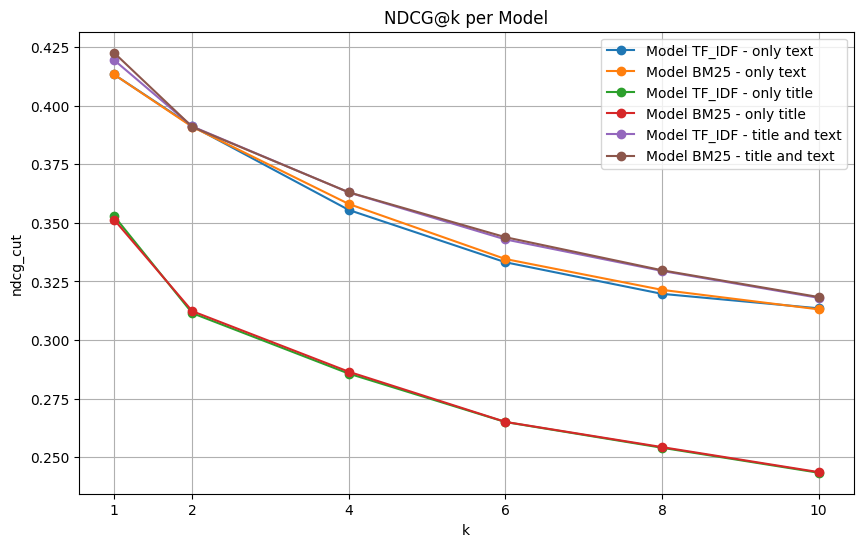

In [ ]:
plot_metrics("ndcg_cut", "NDCG@k per Model", metrics)

#### Query Analysis

The analysis of queries, particularly those with low performance, highlights several factors contributing to "low" metrics.

A key factor is the limited number of documents associated with the query in the qrels. For example, the query PLAIN-1897 has only 2 relevant documents. This implies that even if the retrieval system could correctly identify all the relevant documents, the \(P@10\) (Precision at 10) metric could never reach the maximum value of 1 unless there are at least 10 relevant documents. From the analysis of better-performing queries, it is evident that they tend to have a significantly higher number of associated relevant documents (PLAIN-660, for instance, has 475 relevant documents), which increases the likelihood of achieving high metric values.

A second factor is that low-performing queries often consist of very few terms. While this is not necessarily a negative element (there are short queries with \(P@10\) values equal to 1), the combination of short length and a small number of relevant documents makes the information retrieval process particularly challenging. Longer queries, in fact, increase the likelihood that at least one term will appear in the relevant documents and reduce ambiguity, thereby facilitating matching.

Another critical factor is the absence of query terms (or their stems) within the relevant documents. The lack of overlap between the query terms and those in the documents creates difficulties in calculating similarity using standard methods such as TF-IDF or BM25. Both models rely on the weighted frequency of terms to estimate the relevance of a document to a query. To address this issue, it is essential to ensure greater alignment between the query terms and those in the documents, for instance, by using synonyms, query expansion, or applying more flexible retrieval techniques like fuzzy matching or models leveraging dense representations. Observing queries with high \(P@10\) values reveals that the terms of high-performing queries appear at least once in their respective relevant documents. This suggests that a good starting point for optimizing matching is to work on the lexical alignment between queries and documents.

The analysis of low-performing queries shows that the combination of few relevant documents, short queries, and terms absent from the documents complicates the information retrieval process. Traditional methods such as TF-IDF and BM25, while effective for ranking based on weighted term frequency, encounter significant limitations in these scenarios. To improve retrieval quality, it is necessary to adopt strategies that enhance alignment between queries and documents, expand query capabilities, and integrate more advanced semantic representation models.

In [ ]:
query_analysis(p1)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
1,PLAIN-1897,MED-4992,0.0,-1,polypropylene plastic,0.0,0.0,0.0,0.0,[],[],[],[]
0,PLAIN-1897,MED-4991,0.0,-1,polypropylene plastic,0.0,0.0,0.0,0.0,[],[],[],[]
14,PLAIN-1962,MED-3622,0.0,-1,pumpkin,0.0,0.0,0.0,0.0,[],[],[],[]
12,PLAIN-1962,MED-3621,0.0,-1,pumpkin,0.0,0.0,0.0,0.0,[],[],[],[]
5,PLAIN-1962,MED-2831,0.0,-1,pumpkin,0.0,0.0,0.0,0.0,[],[],[],[]
10,PLAIN-1962,MED-3618,0.0,-1,pumpkin,0.0,0.0,0.0,0.0,[],[],[],[]
11,PLAIN-1962,MED-3620,0.0,-1,pumpkin,0.0,0.0,0.0,0.0,[],[],[],[]
78,PLAIN-1656,MED-2814,0.1,329,mouth cancer,50.0,50.0,50.0,50.0,[cancer],[cancer],[cancer],[cancer]
91,PLAIN-1656,MED-5020,0.1,546,mouth cancer,0.0,50.0,0.0,50.0,[],[cancer],[],[cancer]
69,PLAIN-1656,MED-2205,0.1,412,mouth cancer,50.0,50.0,50.0,50.0,[cancer],[cancer],[cancer],[cancer]



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-660,475
PLAIN-1741,420
PLAIN-3412,49
PLAIN-1656,28
PLAIN-1962,13
PLAIN-1897,2


For completeness, the relevant tables relating to the second pipeline are also shown.

In [ ]:
query_analysis(p2)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
0,PLAIN-1897,MED-4991,0.0,-1,polypropylene plastic,0.0,0.0,0.0,0.0,[],[],[],[]
1,PLAIN-1897,MED-4992,0.0,-1,polypropylene plastic,0.0,0.0,0.0,0.0,[],[],[],[]
5,PLAIN-1929,MED-4665,0.0,-1,prenatal vitamins,0.0,0.0,0.0,0.0,[],[],[],[]
9,PLAIN-1929,MED-4685,0.0,53,prenatal vitamins,0.0,0.0,50.0,50.0,[],[],[vitamin],[vitamin]
10,PLAIN-1929,MED-4772,0.0,-1,prenatal vitamins,0.0,0.0,0.0,0.0,[],[],[],[]
4,PLAIN-1929,MED-4513,0.0,136,prenatal vitamins,0.0,0.0,50.0,50.0,[],[],[vitamin],[vitamin]
7,PLAIN-1929,MED-4667,0.0,-1,prenatal vitamins,0.0,0.0,0.0,0.0,[],[],[],[]
98,PLAIN-1299,MED-4748,0.1,361,growth promoters,0.0,50.0,0.0,50.0,[],[growth],[],[growth]
66,PLAIN-1299,MED-3887,0.1,20,growth promoters,0.0,50.0,0.0,100.0,[],[growth],[],"[growth, promot]"
62,PLAIN-1299,MED-2775,0.1,331,growth promoters,0.0,50.0,0.0,50.0,[],[growth],[],[growth]



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-1837,196
PLAIN-1299,61
PLAIN-1537,45
PLAIN-721,25
PLAIN-1929,10
PLAIN-1897,2


For completeness, the tables relating to the third pipeline are also shown.

In [ ]:
query_analysis(p3)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
2,PLAIN-1516,MED-5102,0.0,-1,lindane,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
3,PLAIN-1516,MED-5104,0.0,-1,lindane,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
1,PLAIN-997,MED-5140,0.0,-1,czechoslovakia,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
0,PLAIN-997,MED-4184,0.0,-1,czechoslovakia,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
4,PLAIN-2890,MED-4250,0.1,6,to snack or not to snack,50.000000,83.333333,50.000000,83.333333,"[snack, or, snack]","[to, snack, or, to, snack]","[snack, or, snack]","[to, snack, or, to, snack]"
33,PLAIN-3074,MED-4555,0.1,0,how to help prevent abdominal aortic aneurysms,42.857143,57.142857,57.142857,57.142857,"[to, abdominal, aortic]","[to, abdominal, aortic, aneurysms]","[to, abdomin, aortic, aneurysm]","[to, abdomin, aortic, aneurysm]"
110,PLAIN-1710,MED-3174,1.0,6,neurocysticercosis,100.000000,100.000000,100.000000,100.000000,[neurocysticercosis],[neurocysticercosis],[neurocysticercosi],[neurocysticercosi]
112,PLAIN-1710,MED-3176,1.0,3,neurocysticercosis,100.000000,0.000000,100.000000,0.000000,[neurocysticercosis],[],[neurocysticercosi],[]
118,PLAIN-1710,MED-3179,1.0,8,neurocysticercosis,100.000000,100.000000,100.000000,100.000000,[neurocysticercosis],[neurocysticercosis],[neurocysticercosi],[neurocysticercosi]
109,PLAIN-1710,MED-3181,1.0,10,neurocysticercosis,100.000000,100.000000,100.000000,100.000000,[neurocysticercosis],[neurocysticercosis],[neurocysticercosi],[neurocysticercosi]



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-2530,72
PLAIN-2890,29
PLAIN-1710,16
PLAIN-997,2
PLAIN-1516,2
PLAIN-3074,1


For completeness, the relevant tables relating to the fourth pipeline are also shown.

In [ ]:
query_analysis(p4)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
2,PLAIN-1827,MED-4539,0.0,-1,peoria,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
4,PLAIN-1827,MED-4541,0.0,-1,peoria,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
3,PLAIN-1827,MED-4540,0.0,-1,peoria,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
1,PLAIN-997,MED-5140,0.0,-1,czechoslovakia,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
0,PLAIN-997,MED-4184,0.0,-1,czechoslovakia,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
51,PLAIN-3352,MED-3545,0.1,110,boosting heart nerve control,25.000000,25.000000,25.000000,25.000000,[control],[control],[control],[control]
16,PLAIN-3352,MED-5026,0.1,28,boosting heart nerve control,25.000000,50.000000,25.000000,50.000000,[heart],"[heart, control]",[heart],"[heart, control]"
27,PLAIN-3352,MED-3425,0.1,31,boosting heart nerve control,25.000000,25.000000,25.000000,25.000000,[heart],[heart],[heart],[heart]
17,PLAIN-3352,MED-5027,0.1,5,boosting heart nerve control,25.000000,50.000000,25.000000,50.000000,[heart],"[heart, control]",[heart],"[heart, control]"
6,PLAIN-3362,MED-5042,0.1,0,kuna indian secret,33.333333,66.666667,33.333333,66.666667,[kuna],"[kuna, indian]",[kuna],"[kuna, indian]"



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-2530,72
PLAIN-3352,39
PLAIN-1710,16
PLAIN-3362,11
PLAIN-1827,3
PLAIN-997,2


For completeness, the tables relating to the fifth pipeline are also shown.

In [ ]:
query_analysis(p5)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
4,PLAIN-1008,MED-4536,0.0,-1,deafness,0.0,0.0,0.0,0.0,[],[],[],[]
1,PLAIN-1008,MED-4533,0.0,-1,deafness,0.0,0.0,0.0,0.0,[],[],[],[]
2,PLAIN-1008,MED-4534,0.0,-1,deafness,0.0,0.0,0.0,0.0,[],[],[],[]
0,PLAIN-1008,MED-4532,0.0,-1,deafness,0.0,0.0,0.0,0.0,[],[],[],[]
3,PLAIN-1008,MED-4535,0.0,-1,deafness,0.0,0.0,0.0,0.0,[],[],[],[]
8,PLAIN-2700,MED-4556,0.0,893,heart disease starts in childhood,20.0,40.0,20.0,40.0,[in],"[disease, in]",[in],"[diseas, in]"
11,PLAIN-2700,MED-4613,0.0,43,heart disease starts in childhood,40.0,60.0,20.0,60.0,"[disease, in]","[heart, disease, in]",[diseas],"[heart, diseas, in]"
12,PLAIN-2700,MED-4617,0.0,453,heart disease starts in childhood,20.0,40.0,20.0,40.0,[in],"[heart, in]",[in],"[heart, in]"
9,PLAIN-2700,MED-4559,0.0,705,heart disease starts in childhood,20.0,40.0,20.0,40.0,[in],"[disease, in]",[in],"[diseas, in]"
7,PLAIN-2700,MED-3255,0.0,470,heart disease starts in childhood,20.0,40.0,20.0,40.0,[in],"[in, childhood]",[in],"[in, childhood]"



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-827,244
PLAIN-1710,16
PLAIN-2700,10
PLAIN-2009,8
PLAIN-2030,6
PLAIN-1008,5


For completeness, the tables relating to the sixth pipeline are also shown.

In [ ]:
query_analysis(p6)

,Query ID,Doc ID,P10,Rank,Query Text,% query words in title,% query words in text,% query stem in title,% query stem in text,Query words in title,Query words in text,Query stems in title,Query stems in text
3,PLAIN-1008,MED-4535,0.0,-1,deafness,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
4,PLAIN-1008,MED-4536,0.0,-1,deafness,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
1,PLAIN-1008,MED-4533,0.0,-1,deafness,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
0,PLAIN-1008,MED-4532,0.0,-1,deafness,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
2,PLAIN-1008,MED-4534,0.0,-1,deafness,0.000000,0.000000,0.000000,0.000000,[],[],[],[]
11,PLAIN-2700,MED-4613,0.0,55,heart disease starts in childhood,40.000000,60.000000,20.000000,60.000000,"[disease, in]","[heart, disease, in]",[diseas],"[heart, diseas, in]"
14,PLAIN-2700,MED-4616,0.0,62,heart disease starts in childhood,40.000000,20.000000,40.000000,20.000000,"[heart, disease]",[in],"[heart, diseas]",[in]
10,PLAIN-2700,MED-4560,0.0,-1,heart disease starts in childhood,20.000000,20.000000,0.000000,20.000000,[in],[in],[],[in]
8,PLAIN-2700,MED-4556,0.0,893,heart disease starts in childhood,20.000000,40.000000,20.000000,40.000000,[in],"[disease, in]",[in],"[diseas, in]"
7,PLAIN-2700,MED-3255,0.0,336,heart disease starts in childhood,20.000000,40.000000,20.000000,40.000000,[in],"[in, childhood]",[in],"[in, childhood]"



Number of relevant documents for query in qrels


,count
Query ID,
PLAIN-2530,72
PLAIN-721,25
PLAIN-2700,10
PLAIN-2500,7
PLAIN-2230,7
PLAIN-1008,5


As can be seen, as the models vary, the problems do not change. This is also due to the low improvement in performance between one model and another.

## PART III: Improving the retrieval performance compared to the baseline (Part II)

In [ ]:
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

def expand_single_query(query: str, model, tokenizer, num_expansions: int = 3) -> list:

  prompt = f"""Given the search query: "{query}" Generate {num_expansions} alternative ways to express the same search intent. Focus on semantic variations that could help capture different relevant results. Return only the expanded queries, one per line, without numbering or explanation."""

  # Prepare input
  inputs = tokenizer(prompt, return_tensors="pt").to(model.device)

  # Generate response
  with torch.no_grad():
    outputs = model.generate(
        **inputs,
        max_new_tokens=150,
        temperature=0.7,
        num_return_sequences=1)

  # Decode and process response
  response = tokenizer.decode(outputs[0], skip_special_tokens=True)
  generated_text = response.split(prompt)[-1].strip()
  expansions = [q.strip() for q in generated_text.split('\n') if q.strip()]
  return expansions[:num_expansions]

def expand_queries(df: pd.DataFrame, expansions: int = 3) -> pd.DataFrame:
  """
  Process queries one at a time using the Qwen model.
  """

  # Initialize model and tokenizer
  model_name = "Qwen/Qwen2.5-1.5B-Instruct"
  device = "cuda" if torch.cuda.is_available() else "cpu"
  tokenizer = AutoTokenizer.from_pretrained(model_name, trust_remote_code=True)
  model = AutoModelForCausalLM.from_pretrained(
      model_name,
      device_map=device,
      trust_remote_code=True,
      torch_dtype=torch.float16 if device == "cuda" else torch.float32
  )

  # Create copy of dataframe
  result_df = df.copy()

  # Process each query individually
  result_df['expanded_queries'] = result_df['query'].apply(
      lambda x: expand_single_query(x, model, tokenizer, num_expansions=expansions)
  )

  return result_df

In [ ]:
from sklearn.preprocessing import MinMaxScaler
os.makedirs('Expansions', exist_ok=True)

def clean_expansion(text, i):
  try:
    q_expanded = re.sub(r'^[^a-zA-Z]+', '', text[i])
  except:
    q_expanded = "error"

  return normalization(q_expanded.replace("/", ''))

def test_expansions(i, weight=0.3):
  if i != 0:
    if not os.path.exists('Expansions/queries_expanded_' + str(i) + '.csv'):
      result_df = expand_queries(query, expansions=i)
      result_df.to_csv('Expansions/queries_expanded_' + str(i) + '.csv', index=False, sep=';')
    else:
      result_df = pd.read_csv('Expansions/queries_expanded_' + str(i) + '.csv', sep=';')
      result_df['expanded_queries'] = result_df['expanded_queries'].apply(eval)

    query_expansions_table = [query]

    for j in range(len(result_df['expanded_queries'][0])):
      result_df[f'expanded_query_{j+1}'] = "error"
      result_df[f'expanded_query_{j+1}'] = result_df['expanded_queries'].apply(lambda x: clean_expansion(x, j))

      query_expansions_table.append(result_df[['qid', f'expanded_query_{j+1}']].copy().rename(columns={f'expanded_query_{j+1}': 'query'}))

    result_list = [br6.transform(search) for search in query_expansions_table]

    j = 0
    for result in result_list:
      scaler = MinMaxScaler()
      result['score'] = scaler.fit_transform(result[['score']])
      if j == 0:
        result['score'] = result['score'] * weight
      else:
        result['score'] = result['score'] * ((1 - weight) / (i))
      j += 1


    score_sum = pd.concat(result_list).groupby(['qid', 'docno'])['score'].sum().reset_index()
    score_sum = score_sum.sort_values(by=['qid', 'score'], ascending=[True, False])
    score_sum['rank'] = score_sum.groupby('qid')['score'].rank(ascending=False, method='first').astype(int)
    score_sum['rank'] = score_sum['rank'] - 1

    df = pd.DataFrame(pt.Evaluate(score_sum, qrels_df, metrics=eval_metrics), index=[i])
    df['name'] = str(i) + " expansions"
  else:
    score_sum = br6.transform(query)
    df = pd.DataFrame(pt.Evaluate(score_sum, qrels_df, metrics=eval_metrics), index=[i])
    df['name'] = "no expansions: baseline"

  return score_sum, df

In [ ]:
warnings.filterwarnings("ignore", category=UserWarning)
n_expansions = [0, 1, 3, 5, 7, 9]

results_expansions = []
evaluation_expansions = []

for i in n_expansions:
  print(f"Analysis with {i} expansions...", end=" ")
  result, expansion = test_expansions(i)

  results_expansions.append(result)
  evaluation_expansions.append(expansion)

  print("Done")

final_evaluation_expansions = pd.concat(evaluation_expansions).reset_index()

display(final_evaluation_expansions[view_table].round(3))

0.1
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.128,0.312,0.327,0.310,0.299,0.286,0.274,0.265,0.347,...,0.236,0.209,0.189,0.044,0.070,0.105,0.121,0.130,0.137,1 expansions
2,3,0.133,0.364,0.348,0.333,0.318,0.304,0.297,0.288,0.368,...,0.254,0.234,0.212,0.040,0.065,0.097,0.119,0.138,0.151,3 expansions
3,5,0.159,0.409,0.387,0.376,0.355,0.344,0.333,0.324,0.409,...,0.287,0.259,0.238,0.058,0.084,0.111,0.134,0.149,0.160,5 expansions
4,7,0.167,0.431,0.420,0.397,0.364,0.346,0.335,0.325,0.440,...,0.283,0.258,0.234,0.058,0.088,0.120,0.139,0.151,0.161,7 expansions
5,9,0.164,0.439,0.418,0.389,0.368,0.351,0.340,0.329,0.440,...,0.294,0.265,0.241,0.060,0.083,0.116,0.133,0.150,0.160,9 expansions


0.2
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.136,0.320,0.342,0.323,0.308,0.300,0.287,0.280,0.362,...,0.249,0.220,0.202,0.049,0.071,0.107,0.125,0.137,0.146,1 expansions
2,3,0.145,0.376,0.358,0.357,0.333,0.320,0.311,0.305,0.378,...,0.267,0.243,0.224,0.045,0.075,0.106,0.125,0.144,0.159,3 expansions
3,5,0.166,0.415,0.406,0.393,0.367,0.351,0.343,0.333,0.427,...,0.291,0.269,0.245,0.059,0.087,0.114,0.134,0.153,0.166,5 expansions
4,7,0.170,0.434,0.421,0.407,0.374,0.355,0.343,0.333,0.440,...,0.293,0.266,0.242,0.056,0.089,0.123,0.142,0.154,0.165,7 expansions
5,9,0.171,0.444,0.430,0.404,0.383,0.366,0.352,0.340,0.452,...,0.307,0.274,0.248,0.061,0.087,0.121,0.141,0.157,0.165,9 expansions


0.3
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.145,0.329,0.368,0.345,0.327,0.319,0.308,0.298,0.390,...,0.267,0.239,0.215,0.050,0.077,0.115,0.133,0.145,0.155,1 expansions
2,3,0.156,0.386,0.382,0.376,0.355,0.338,0.330,0.323,0.399,...,0.281,0.258,0.238,0.050,0.080,0.114,0.129,0.148,0.167,3 expansions
3,5,0.170,0.418,0.421,0.407,0.376,0.363,0.351,0.341,0.440,...,0.302,0.274,0.248,0.060,0.091,0.119,0.141,0.156,0.170,5 expansions
4,7,0.172,0.435,0.424,0.415,0.382,0.360,0.348,0.339,0.443,...,0.299,0.271,0.248,0.056,0.090,0.124,0.142,0.154,0.167,7 expansions
5,9,0.171,0.444,0.420,0.412,0.383,0.365,0.352,0.341,0.440,...,0.306,0.276,0.252,0.056,0.089,0.123,0.142,0.156,0.165,9 expansions


0.4
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.154,0.338,0.395,0.369,0.346,0.336,0.323,0.314,0.415,...,0.281,0.248,0.228,0.056,0.083,0.118,0.137,0.150,0.160,1 expansions
2,3,0.163,0.392,0.415,0.399,0.367,0.352,0.341,0.333,0.433,...,0.291,0.264,0.243,0.054,0.086,0.115,0.139,0.154,0.170,3 expansions
3,5,0.172,0.420,0.426,0.410,0.383,0.365,0.355,0.344,0.446,...,0.305,0.276,0.250,0.059,0.093,0.122,0.144,0.159,0.173,5 expansions
4,7,0.172,0.435,0.429,0.416,0.382,0.362,0.350,0.338,0.446,...,0.301,0.273,0.246,0.057,0.090,0.123,0.141,0.155,0.164,7 expansions
5,9,0.172,0.445,0.429,0.413,0.388,0.370,0.353,0.343,0.452,...,0.310,0.274,0.251,0.057,0.088,0.123,0.144,0.158,0.168,9 expansions


0.5
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.159,0.343,0.416,0.389,0.362,0.349,0.335,0.326,0.437,...,0.290,0.258,0.236,0.058,0.086,0.120,0.139,0.152,0.162,1 expansions
2,3,0.167,0.395,0.427,0.411,0.377,0.358,0.347,0.336,0.446,...,0.295,0.267,0.243,0.057,0.092,0.120,0.137,0.154,0.166,3 expansions
3,5,0.172,0.419,0.430,0.413,0.380,0.365,0.354,0.343,0.452,...,0.304,0.277,0.249,0.059,0.091,0.119,0.145,0.158,0.172,5 expansions
4,7,0.172,0.435,0.433,0.416,0.382,0.363,0.350,0.339,0.452,...,0.302,0.273,0.248,0.057,0.090,0.123,0.142,0.155,0.164,7 expansions
5,9,0.172,0.444,0.427,0.406,0.388,0.368,0.352,0.340,0.449,...,0.309,0.274,0.249,0.057,0.086,0.124,0.145,0.158,0.167,9 expansions


0.6
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.161,0.346,0.433,0.400,0.374,0.357,0.342,0.331,0.455,...,0.296,0.262,0.238,0.059,0.087,0.124,0.142,0.152,0.164,1 expansions
2,3,0.167,0.395,0.427,0.409,0.377,0.359,0.347,0.336,0.446,...,0.297,0.269,0.244,0.056,0.092,0.119,0.138,0.155,0.167,3 expansions
3,5,0.171,0.418,0.432,0.411,0.380,0.365,0.350,0.340,0.455,...,0.304,0.272,0.246,0.059,0.091,0.119,0.145,0.158,0.169,5 expansions
4,7,0.171,0.433,0.420,0.409,0.381,0.361,0.348,0.336,0.437,...,0.302,0.272,0.246,0.056,0.090,0.123,0.142,0.154,0.163,7 expansions
5,9,0.171,0.442,0.426,0.403,0.385,0.365,0.350,0.338,0.449,...,0.307,0.274,0.248,0.057,0.085,0.123,0.141,0.159,0.167,9 expansions


0.7
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.161,0.345,0.433,0.403,0.375,0.358,0.342,0.331,0.455,...,0.297,0.263,0.238,0.058,0.087,0.125,0.142,0.153,0.162,1 expansions
2,3,0.167,0.393,0.426,0.404,0.379,0.356,0.345,0.335,0.443,...,0.294,0.266,0.244,0.056,0.091,0.121,0.137,0.155,0.168,3 expansions
3,5,0.170,0.417,0.438,0.409,0.381,0.361,0.347,0.337,0.458,...,0.299,0.267,0.244,0.059,0.089,0.121,0.141,0.157,0.169,5 expansions
4,7,0.170,0.432,0.427,0.408,0.381,0.361,0.345,0.335,0.446,...,0.301,0.267,0.245,0.056,0.090,0.123,0.140,0.152,0.161,7 expansions
5,9,0.170,0.441,0.426,0.404,0.383,0.360,0.347,0.337,0.449,...,0.301,0.271,0.248,0.056,0.085,0.123,0.139,0.157,0.166,9 expansions


0.8
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.161,0.344,0.437,0.401,0.375,0.357,0.341,0.329,0.458,...,0.296,0.262,0.237,0.058,0.088,0.124,0.142,0.152,0.159,1 expansions
2,3,0.165,0.390,0.420,0.401,0.374,0.352,0.338,0.331,0.440,...,0.293,0.261,0.241,0.055,0.089,0.121,0.137,0.150,0.166,3 expansions
3,5,0.169,0.415,0.437,0.403,0.380,0.358,0.343,0.336,0.455,...,0.297,0.264,0.243,0.059,0.088,0.122,0.139,0.154,0.168,5 expansions
4,7,0.169,0.431,0.426,0.397,0.379,0.356,0.343,0.332,0.446,...,0.296,0.267,0.242,0.057,0.088,0.123,0.138,0.152,0.160,7 expansions
5,9,0.169,0.440,0.429,0.402,0.379,0.360,0.344,0.335,0.452,...,0.302,0.269,0.245,0.057,0.085,0.123,0.140,0.152,0.164,9 expansions


0.9
Analysis with 0 expansions... Done
Analysis with 1 expansions... Done
Analysis with 3 expansions... Done
Analysis with 5 expansions... Done
Analysis with 7 expansions... Done
Analysis with 9 expansions... Done


,index,map,ndcg,ndcg_cut.1,ndcg_cut.2,ndcg_cut.4,ndcg_cut.6,ndcg_cut.8,ndcg_cut.10,P.1,...,P.6,P.8,P.10,recall.1,recall.2,recall.4,recall.6,recall.8,recall.10,name
0,0,0.149,0.298,0.423,0.391,0.363,0.344,0.330,0.318,0.443,...,0.286,0.255,0.231,0.056,0.083,0.114,0.130,0.141,0.150,no expansions: baseline
1,1,0.159,0.342,0.427,0.397,0.372,0.353,0.338,0.328,0.449,...,0.292,0.261,0.238,0.057,0.088,0.123,0.139,0.150,0.159,1 expansions
2,3,0.164,0.389,0.416,0.397,0.369,0.348,0.337,0.328,0.437,...,0.288,0.260,0.239,0.055,0.088,0.119,0.136,0.151,0.165,3 expansions
3,5,0.168,0.413,0.430,0.399,0.374,0.354,0.341,0.333,0.449,...,0.293,0.264,0.241,0.059,0.087,0.121,0.138,0.150,0.167,5 expansions
4,7,0.167,0.429,0.429,0.398,0.374,0.353,0.341,0.330,0.449,...,0.294,0.264,0.240,0.056,0.088,0.122,0.137,0.149,0.160,7 expansions
5,9,0.168,0.439,0.429,0.400,0.376,0.356,0.342,0.332,0.449,...,0.297,0.266,0.243,0.056,0.085,0.122,0.139,0.150,0.164,9 expansions


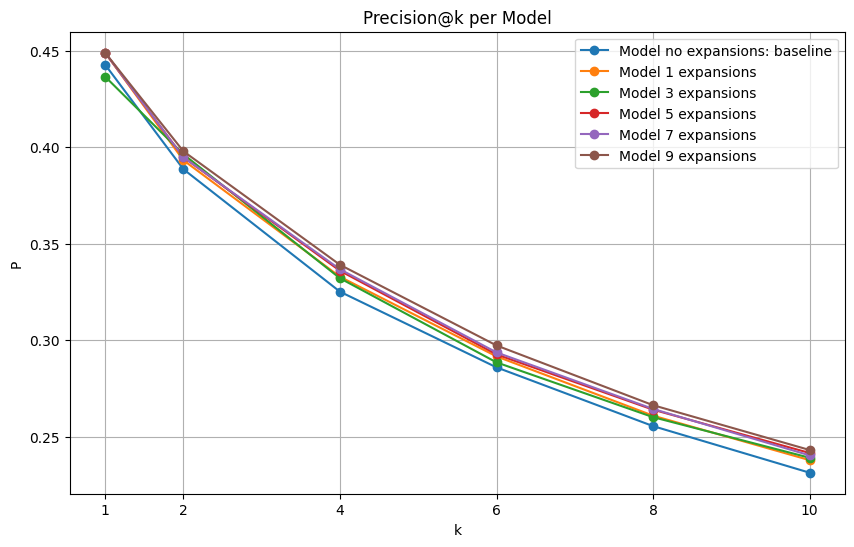

In [ ]:
plot_metrics("P", "Precision@k per Model", final_evaluation_expansions)

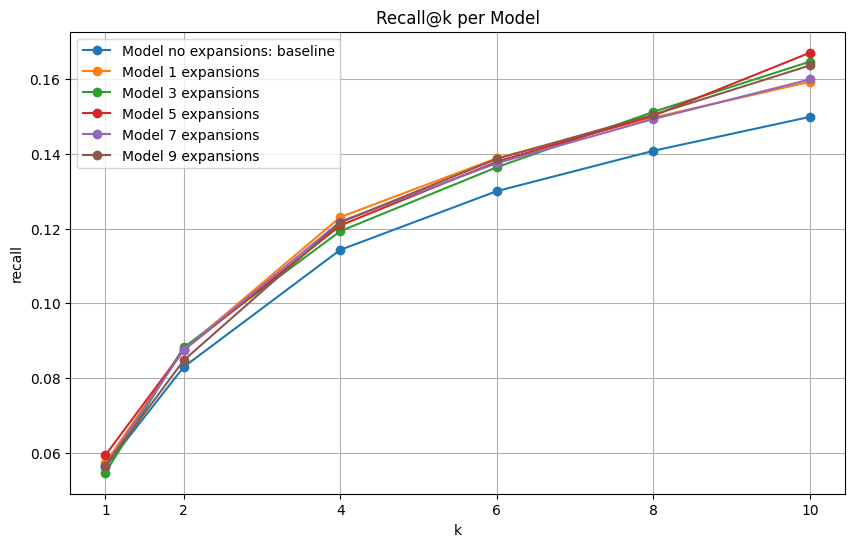

In [ ]:
plot_metrics("recall", "Recall@k per Model", final_evaluation_expansions)

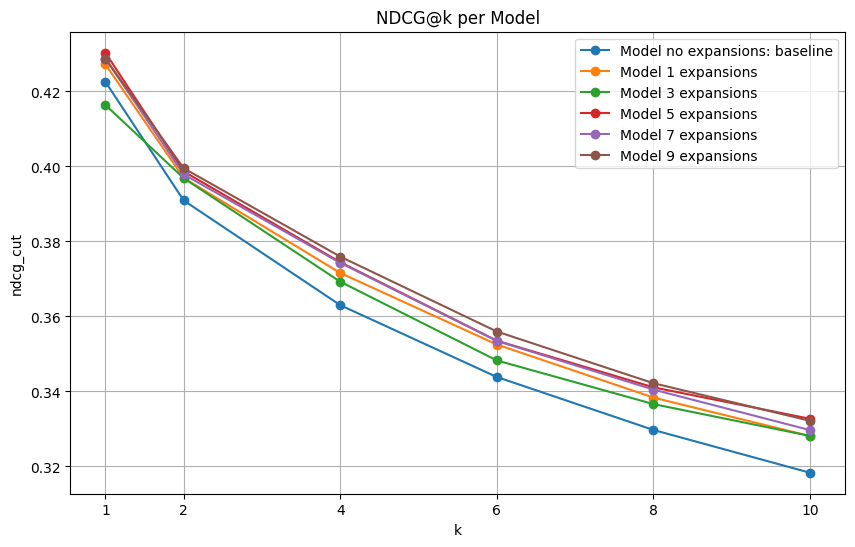

In [ ]:
plot_metrics("ndcg_cut", "NDCG@k per Model", final_evaluation_expansions)